In [2]:
import pandas as pd

# Define the file path
file_path = '../data/raw/dataset.xlsx'

# Load the data into a DataFrame
data = pd.read_excel(file_path)

# Display the first few rows of the DataFrame
print("Data loaded successfully. Here are the first few rows:")
data.head()


Data loaded successfully. Here are the first few rows:


,HAEMATOCRIT,HAEMOGLOBINS,ERYTHROCYTE,LEUCOCYTE,THROMBOCYTE,MCH,MCHC,MCV,AGE,SEX,SOURCE
0,33.8,11.1,4.18,4.6,150,26.6,32.8,80.9,33,F,1
1,44.6,14.0,6.86,6.3,232,20.4,31.4,65.0,36,M,0
2,42.9,14.0,4.57,6.2,336,30.6,32.6,93.9,70,F,0
3,41.9,14.4,4.67,3.5,276,30.8,34.4,89.7,18,F,0
4,40.6,13.3,4.85,14.9,711,27.4,32.8,83.7,36,M,0


In [6]:
import pandas as pd


file_path = r'C:\Users\akp24\docassist-main\data\raw\dataset.xlsx'

data = pd.read_excel(file_path)

# Convert SEX column to numerical: M -> 1, F -> 0
data['SEX'] = data['SEX'].map({'M': 1, 'F': 0})

# EDA
descriptive_stats = data.describe().T

mean_values = data.mean()
median_values = data.median()
mode_values = data.mode().iloc[0]

std_dev = data.std()
variance = data.var()

# Calculate grouped statistics (based on SEX, SOURCE)
grouped_stats = data.groupby(['SEX', 'SOURCE']).agg(['mean', 'median', 'std', 'var'])

# Save the results to CSV files 
descriptive_stats.to_csv(r'C:\Users\akp24\docassist-main\data\processed\descriptive_stats.csv', index=True)
mean_values.to_csv(r'C:\Users\akp24\docassist-main\data\processed\mean_values.csv', header=True)
median_values.to_csv(r'C:\Users\akp24\docassist-main\data\processed\median_values.csv', header=True)
mode_values.to_csv(r'C:\Users\akp24\docassist-main\data\processed\mode_values.csv', header=True)
std_dev.to_csv(r'C:\Users\akp24\docassist-main\data\processed\std_dev.csv', header=True)
variance.to_csv(r'C:\Users\akp24\docassist-main\data\processed\variance.csv', header=True)
grouped_stats.to_csv(r'C:\Users\akp24\docassist-main\data\processed\grouped_stats.csv', index=True)

print("Exploratory Data Analysis completed and outputs saved successfully in the processed/ folder.")


Exploratory Data Analysis completed and outputs saved successfully in the processed/ folder.


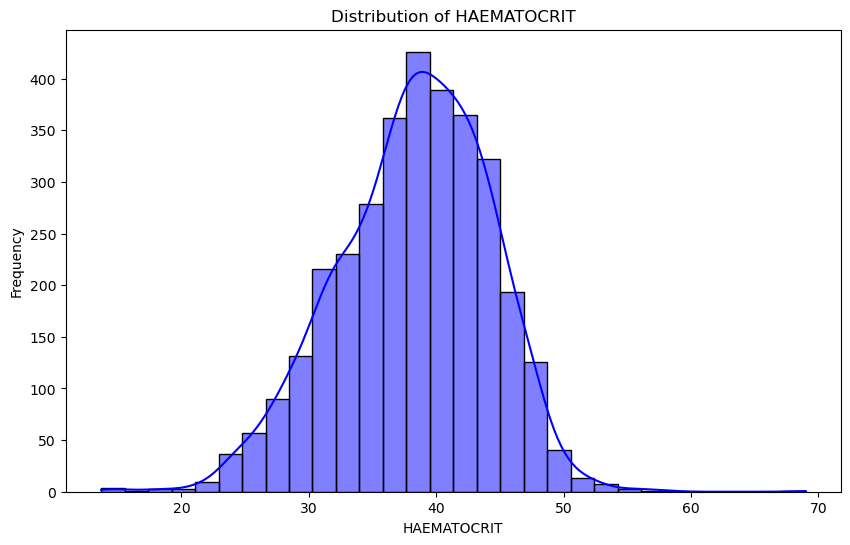

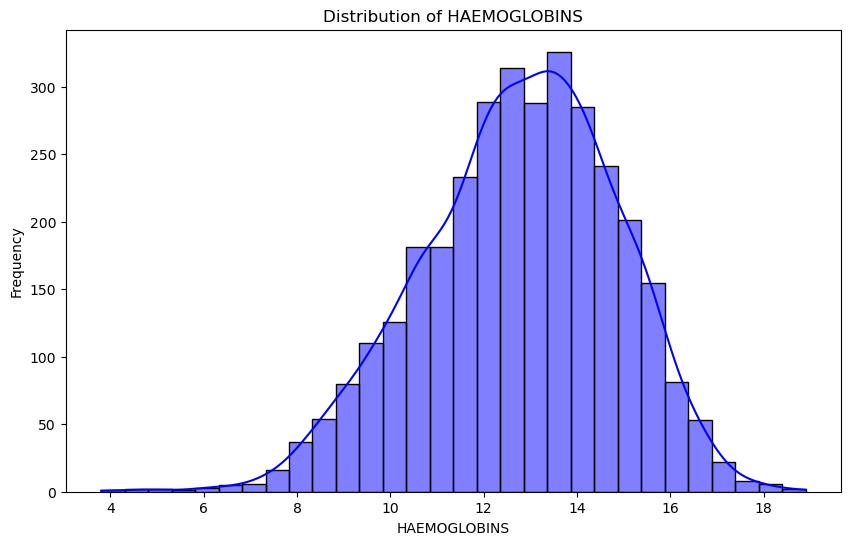

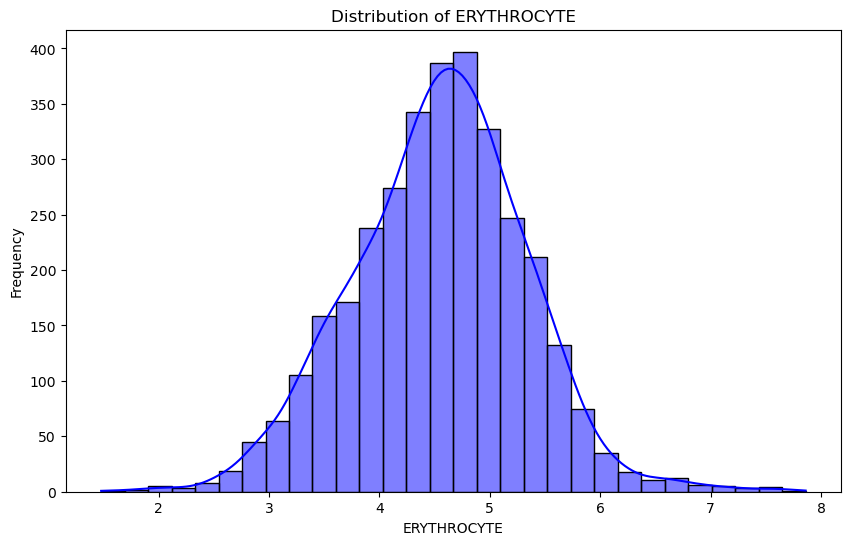

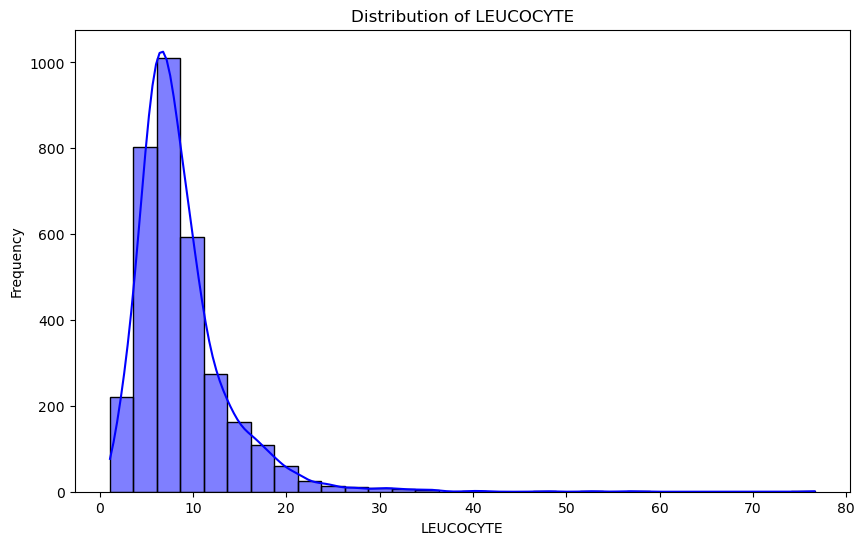

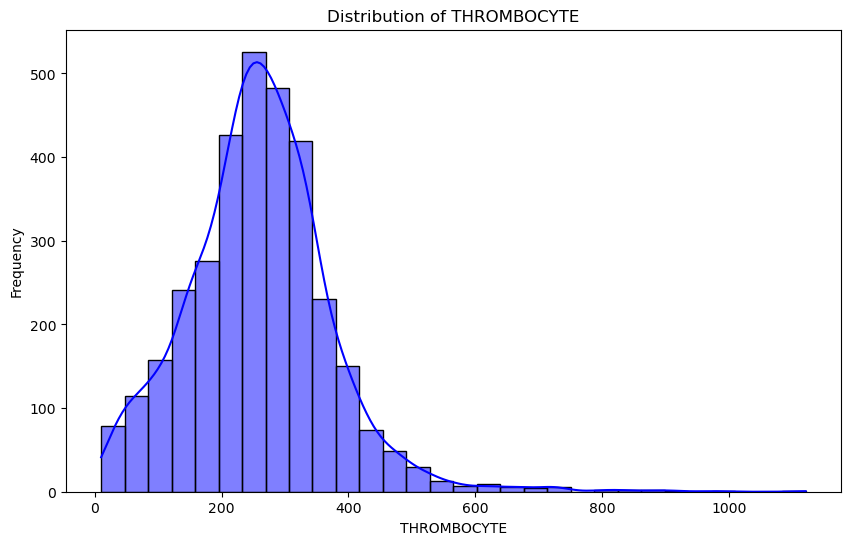

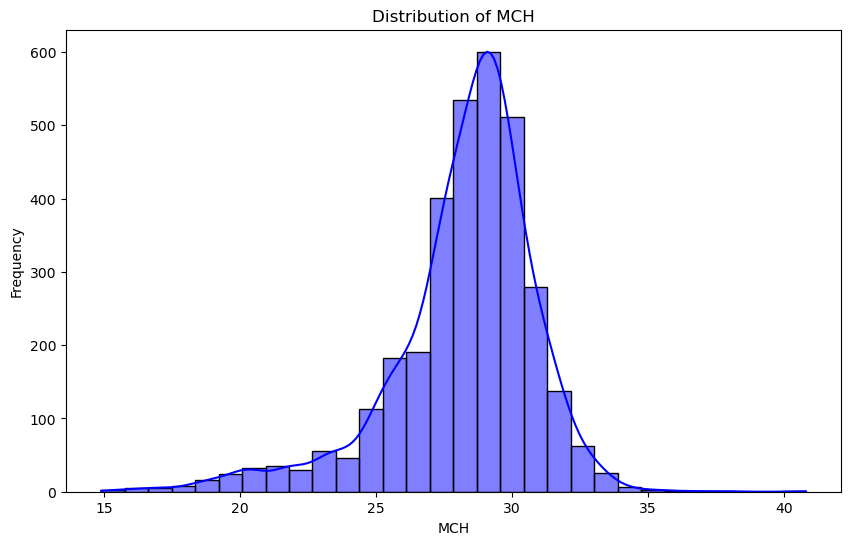

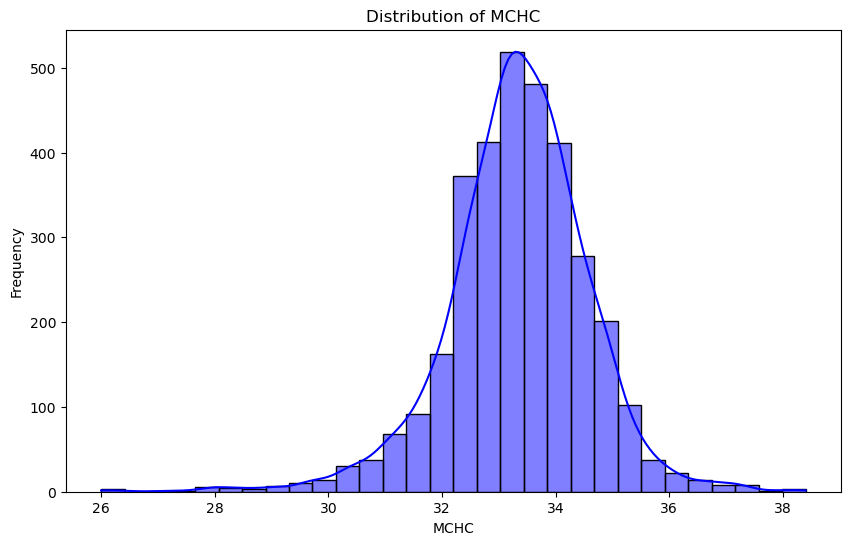

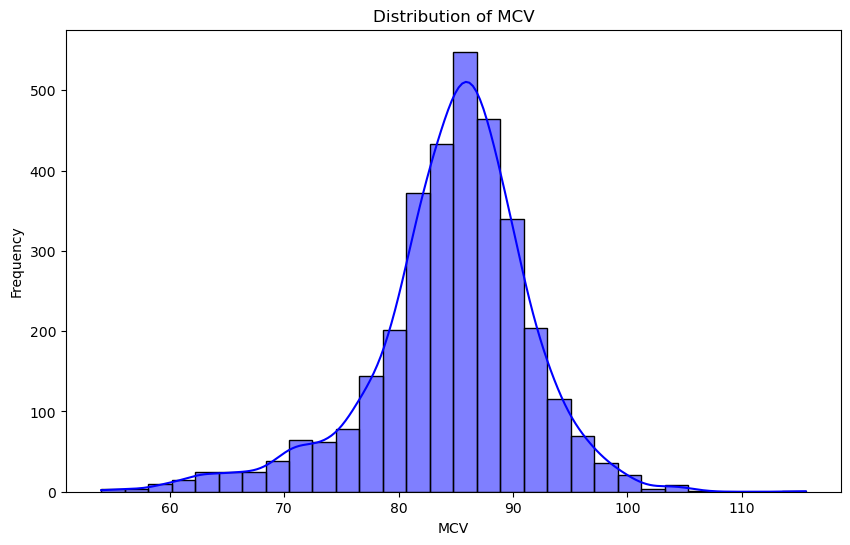

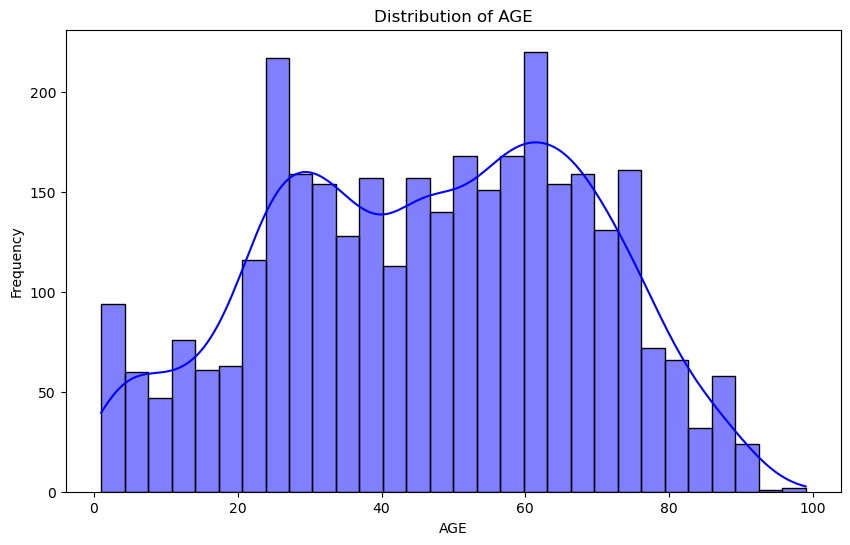

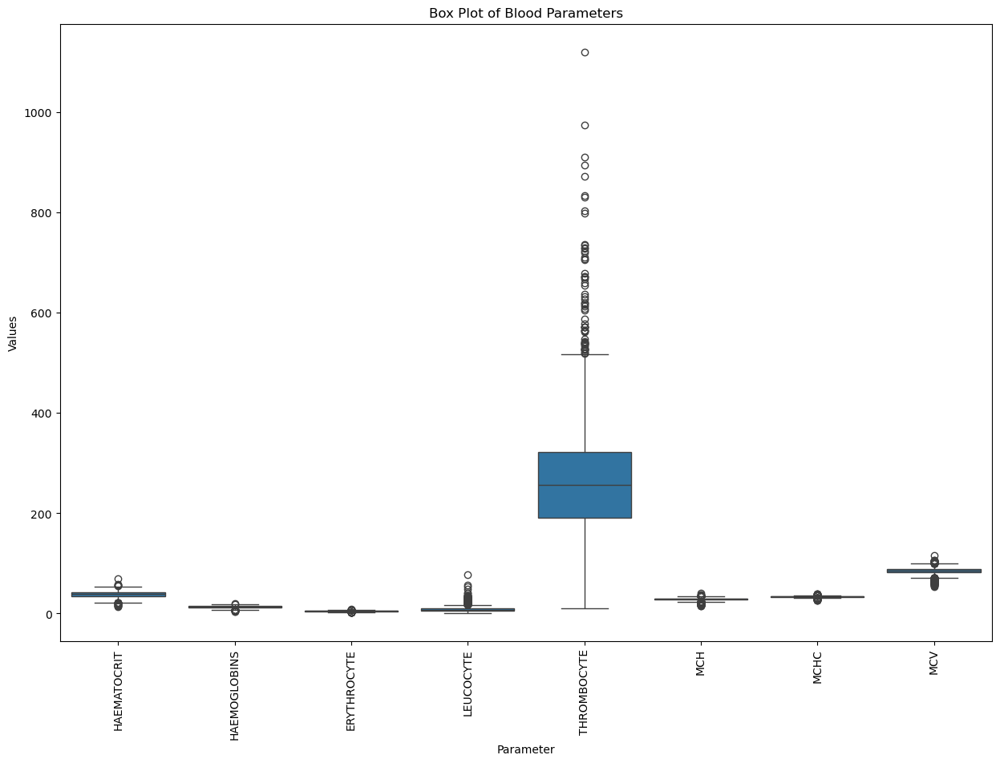

Visualizations have been completed and saved to: C:\Users\akp24\docassist-main\visuals\\


In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

data_file_path = r'C:\Users\akp24\docassist-main\data\raw\dataset.xlsx'
output_folder = r'C:\Users\akp24\docassist-main\visuals\\'
data = pd.read_excel(data_file_path)

# Convert SEX column to numerical: M -> 1, F -> 0
data['SEX'] = data['SEX'].map({'M': 1, 'F': 0})

# Histogram plotting
for column in data.columns:
    if column not in ['SEX', 'SOURCE']:
        plt.figure(figsize=(10, 6))
        sns.histplot(data[column], kde=True, bins=30, color='blue')
        plt.title(f'Distribution of {column}')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        plt.savefig(output_folder + f'{column}_hist_density.png')
        plt.show()

# Box plotting
plt.figure(figsize=(15, 10))
data_melted = pd.melt(data, id_vars=['SEX', 'AGE', 'SOURCE'], value_vars=[col for col in data.columns if col not in ['SEX', 'SOURCE']])
sns.boxplot(x='variable', y='value', data=data_melted)
plt.title('Box Plot of Blood Parameters')
plt.xlabel('Parameter')
plt.ylabel('Values')
plt.xticks(rotation=90)
plt.savefig(output_folder + 'box_plot_parameters.png')
plt.show()

print("Visualizations have been completed and saved to:", output_folder)


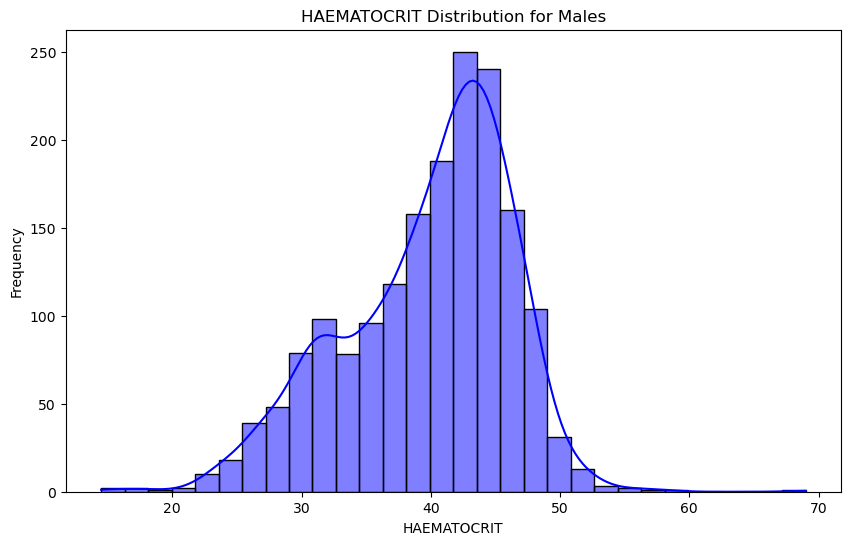

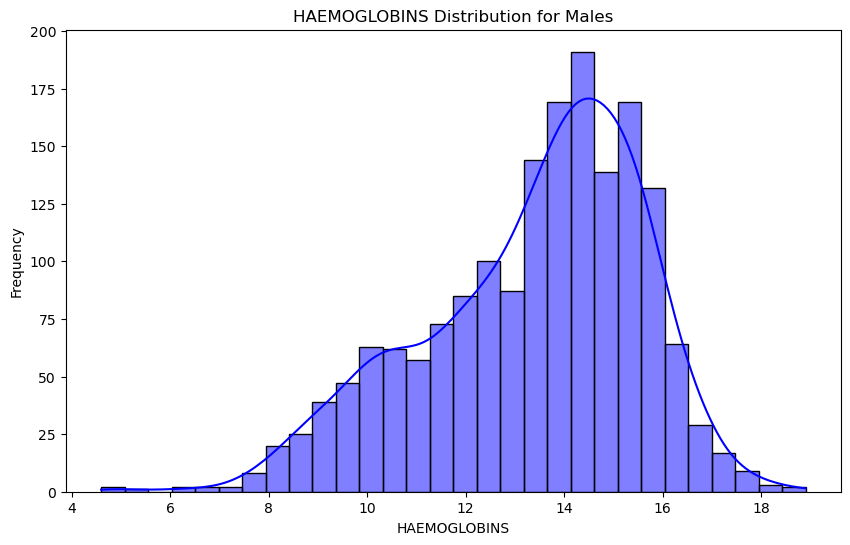

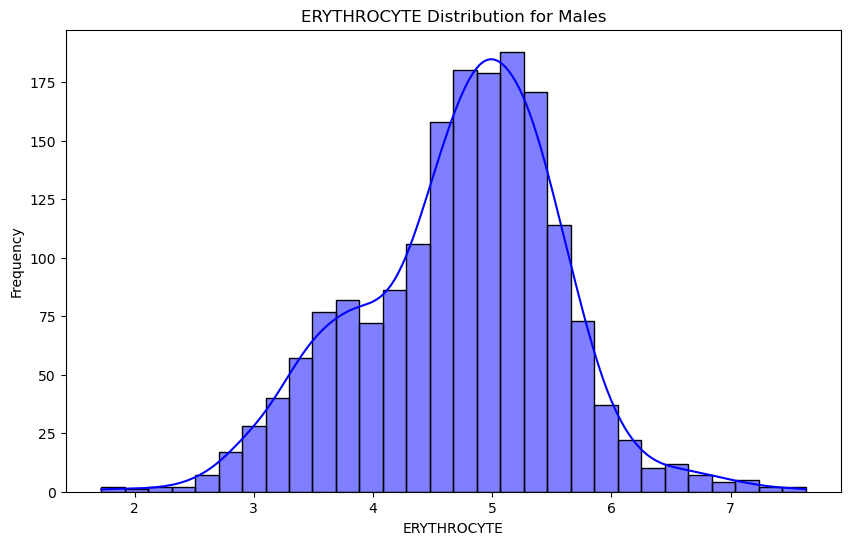

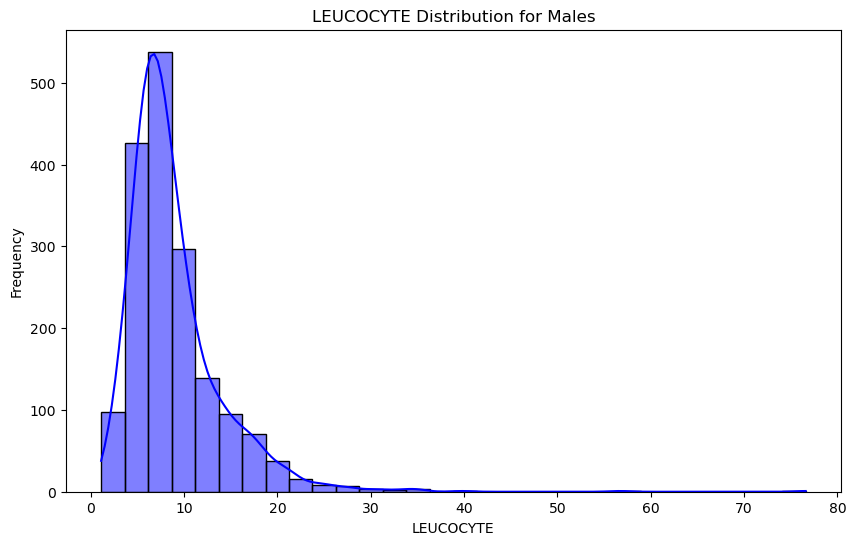

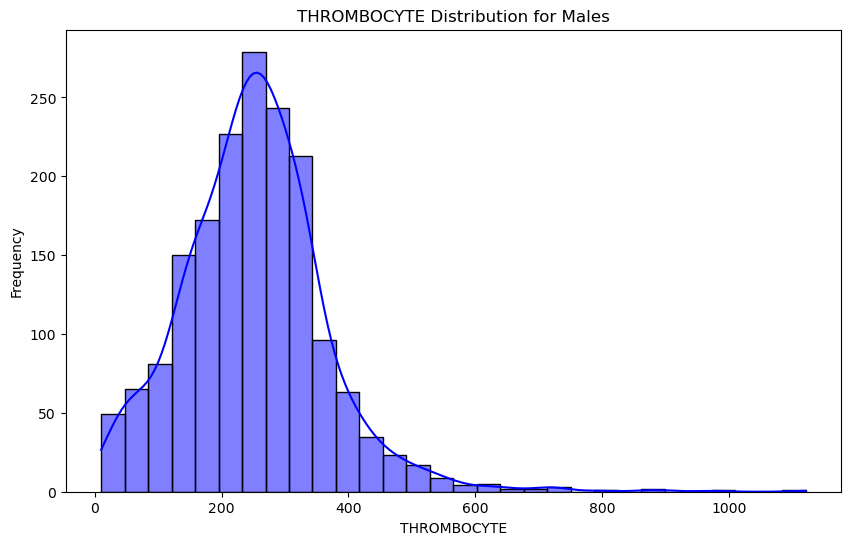

...

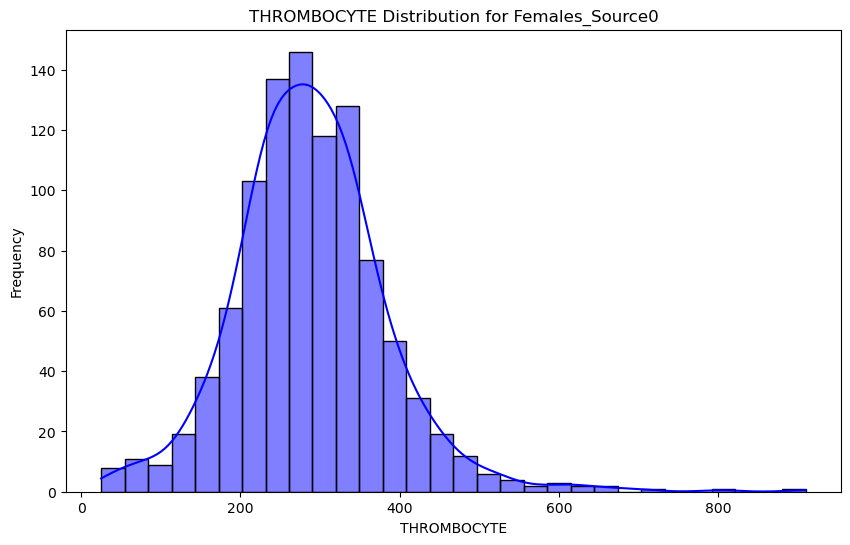

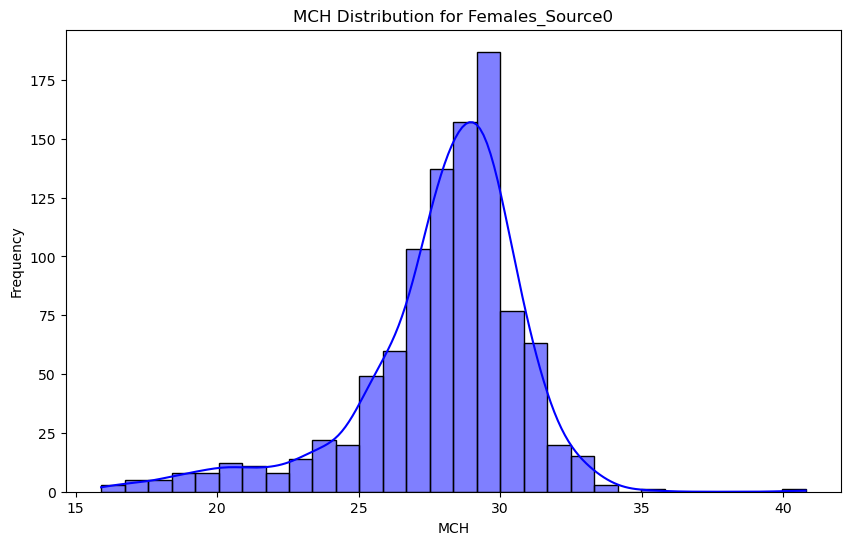

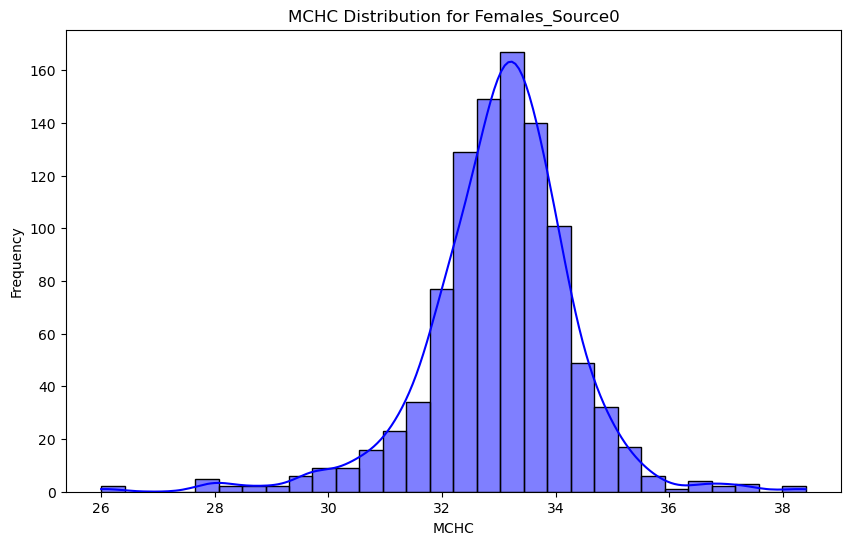

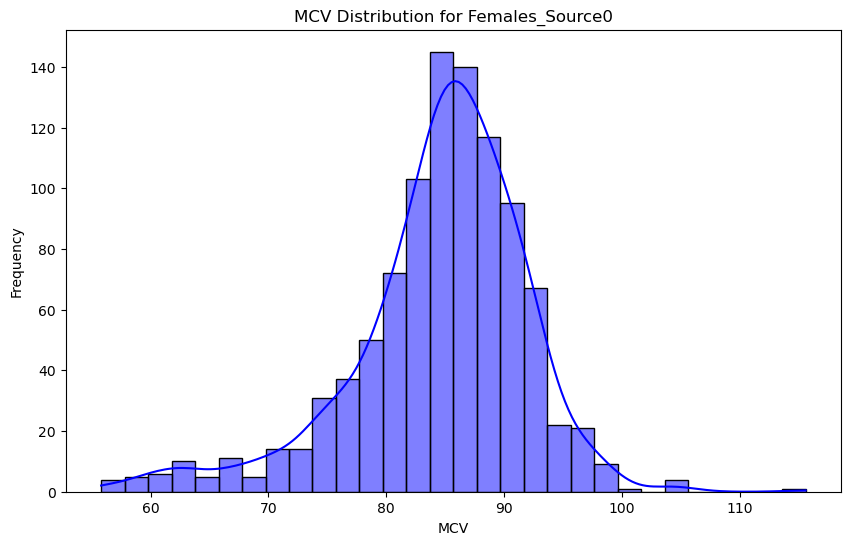

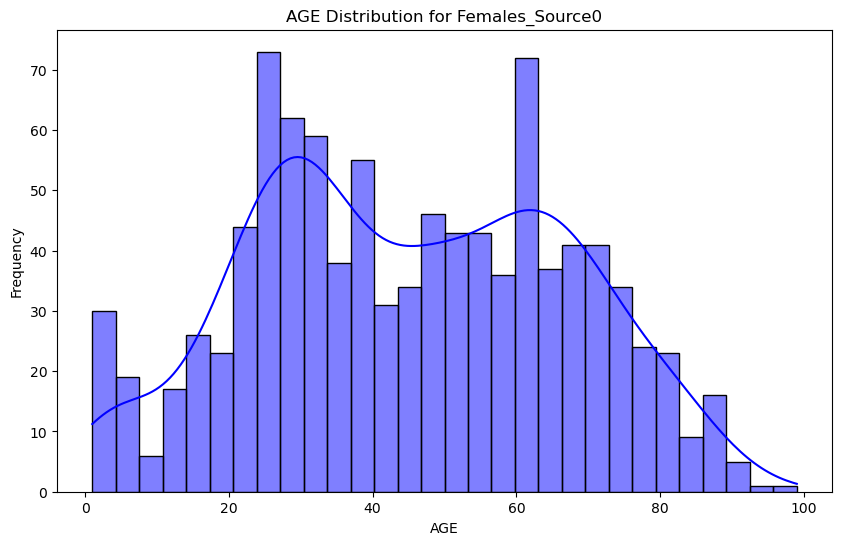

Visualizations for all specified groups have been completed and saved.


In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

data_file_path = r'C:\Users\akp24\docassist-main\data\raw\dataset.xlsx'
output_folder = r'C:\Users\akp24\docassist-main\visuals\\'
data = pd.read_excel(data_file_path)

# Convert SEX column to numerical: M -> 1, F -> 0
data['SEX'] = data['SEX'].map({'M': 1, 'F': 0})

# function to plot histograms
def plot_histograms(data, group_col, filter_val, group_name):
    for column in data.columns:
        if column not in ['SEX', 'SOURCE']:
            plt.figure(figsize=(10, 6))
            sns.histplot(data[data[group_col] == filter_val][column], kde=True, bins=30, color='blue')
            plt.title(f'{column} Distribution for {group_name}')
            plt.xlabel(column)
            plt.ylabel('Frequency')
            plt.savefig(output_folder + f'{column}_{group_name}_hist_density.png')
            plt.show()

# 1. Histograms for Age & Each Parameter for Males
plot_histograms(data, 'SEX', 1, 'Males')

# 2. Histograms for Age & Each Parameter for Females
plot_histograms(data, 'SEX', 0, 'Females')

# 3. Histograms for Source & Each Parameter for Males
plot_histograms(data[data['SEX'] == 1], 'SOURCE', 1, 'Males_Source1')
plot_histograms(data[data['SEX'] == 1], 'SOURCE', 0, 'Males_Source0')

# 4. Histograms for Source & Each Parameter for Females
plot_histograms(data[data['SEX'] == 0], 'SOURCE', 1, 'Females_Source1')
plot_histograms(data[data['SEX'] == 0], 'SOURCE', 0, 'Females_Source0')

print("Visualizations for all specified groups have been completed and saved.")


,HAEMATOCRIT,HAEMOGLOBINS,ERYTHROCYTE,LEUCOCYTE,THROMBOCYTE,MCH,MCHC,MCV,AGE,SOURCE
count,3309.000000,3309.000000,3309.000000,3309.000000,3309.000000,3309.000000,3309.000000,3309.000000,3309.000000,3309.000000
mean,38.226111,12.749350,4.544802,8.715533,258.893019,28.230039,33.336476,84.611333,46.644303,0.398005
std,5.971943,2.084325,0.784510,4.991299,112.676139,2.696520,1.247055,6.916079,21.874106,0.489561
min,13.700000,3.800000,1.480000,1.100000,10.000000,14.900000,26.000000,54.000000,1.000000,0.000000
25%,34.300000,11.400000,4.040000,5.700000,191.000000,27.200000,32.700000,81.500000,29.000000,0.000000
50%,38.700000,12.900000,4.580000,7.600000,257.000000,28.700000,33.400000,85.300000,48.000000,0.000000
75%,42.500000,14.200000,5.060000,10.300000,322.000000,29.800000,34.100000,88.800000,64.000000,1.000000
max,69.000000,18.900000,7.860000,76.600000,1121.000000,40.800000,38.400000,115.600000,99.000000,1.000000


HAEMATOCRIT                                                     \
             count       mean       std   min   25%   50%   75%   max   
SOURCE                                                                  
0           1992.0  39.548394  5.532064  13.7  36.3  39.9  43.4  69.0   
1           1317.0  36.226120  6.057852  16.7  31.7  36.5  40.6  55.8   

       HAEMOGLOBINS             ...   MCV            AGE             \
              count       mean  ...   75%    max   count       mean   
SOURCE                          ...                                   
0            1992.0  13.181376  ...  89.0  115.6  1992.0  44.626004   
1            1317.0  12.095900  ...  88.4  105.9  1317.0  49.697039   

                                                
              std  min   25%   50%   75%   max  
SOURCE                                          
0       21.649929  1.0  28.0  45.0  62.0  99.0  
1       21.865715  1.0  33.0  53.0  67.0  98.0  

[2 rows x 72 columns]

HAEMATOCRIT                                                       \
          count       mean       std   min     25%   50%   75%   max   
SEX                                                                    
F        1566.0  36.490421  4.862862  13.7  33.525  37.1  39.8  56.0   
M        1743.0  39.785542  6.429527  14.5  35.700  41.2  44.5  69.0   

    HAEMOGLOBINS             ...   AGE        SOURCE                           \
           count       mean  ...   75%   max   count      mean       std  min   
SEX                          ...                                                
F         1566.0  12.063729  ...  63.0  99.0  1566.0  0.368455  0.482540  0.0   
M         1743.0  13.365347  ...  65.0  91.0  1743.0  0.424555  0.494417  0.0   

                         
     25%  50%  75%  max  
SEX                      
F    0.0  0.0  1.0  1.0  
M    0.0  0.0  1.0  1.0  

[2 rows x 80 columns]

HAEMATOCRIT                                    \
                                   count       mean       std   min    25%   
AGE_GROUP                                                                    
Infants and Young Children         240.0  37.644167  4.181986  24.2  34.70   
Adolescents and Young Adults       887.0  40.345772  5.533045  14.6  37.10   
Middle-aged Adults                 883.0  39.097055  5.825387  17.7  35.65   
Older Adults                       991.0  36.920585  6.040046  13.7  32.60   
Elderly                            308.0  34.278896  5.533479  15.3  30.40   

                                                  HAEMOGLOBINS             \
                                50%     75%   max        count       mean   
AGE_GROUP                                                                   
Infants and Young Children    37.40  40.000  54.0        240.0  12.534167   
Adolescents and Young Adults  40.80  44.400  57.0        887.0  13.446787   
Middle-aged Adults            39.70  43.300  55.3        883.0  13.032503   
Older Adults                  37.70  41.250  69.0        991.0  12.331584   
Elderly                       33.75  38.325  56.0        308.0  11.440909   

                              ...   AGE       SOURCE                           \
                              ...   75%   max  count      mean       std  min   
AGE_GROUP                     ...                                               
Infants and Young Children    ...   9.0  12.0  240.0  0.358333  0.480513  0.0   
Adolescents and Young Adults  ...  31.0  35.0  887.0  0.322435  0.467672  0.0   
Middle-aged Adults            ...  51.0  55.0  883.0  0.392978  0.488689  0.0   
Older Adults                  ...  69.0  75.0  991.0  0.445005  0.497217  0.0   
Elderly                       ...  86.0  99.0  308.0  0.509740  0.500719  0.0   

                                                  
                              25%  50%  75%  max  
AGE_GROUP                                         
Infants and Young Children    0.0  0.0  1.0  1.0  
Adolescents and Young Adults  0.0  0.0  1.0  1.0  
Middle-aged Adults            0.0  0.0  1.0  1.0  
Older Adults                  0.0  0.0  1.0  1.0  
Elderly                       0.0  1.0  1.0  1.0  

[5 rows x 80 columns]

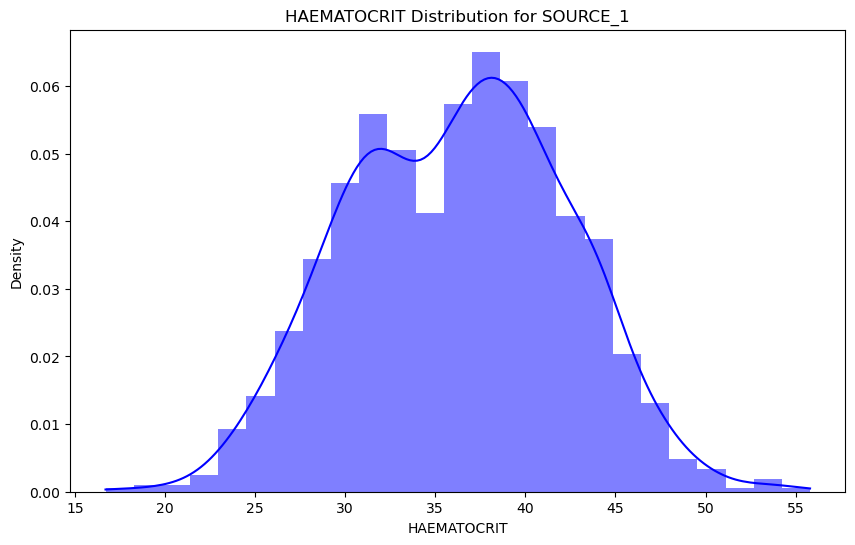

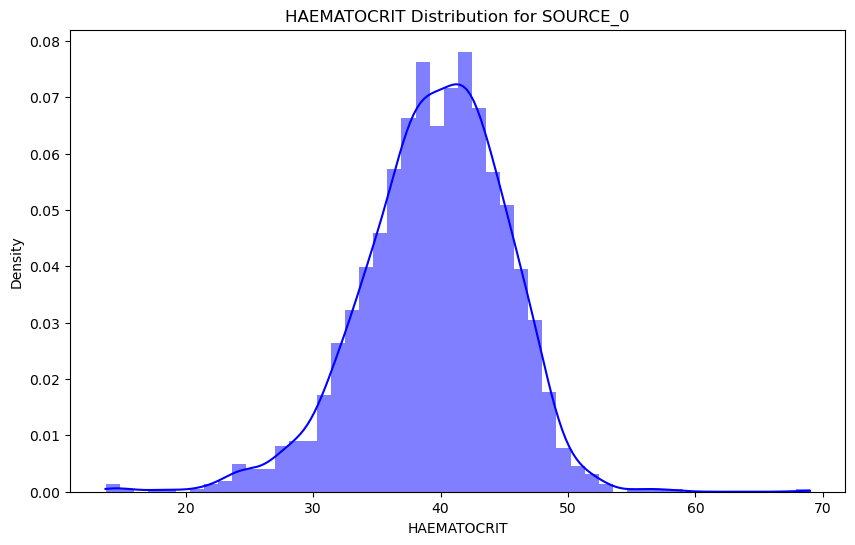

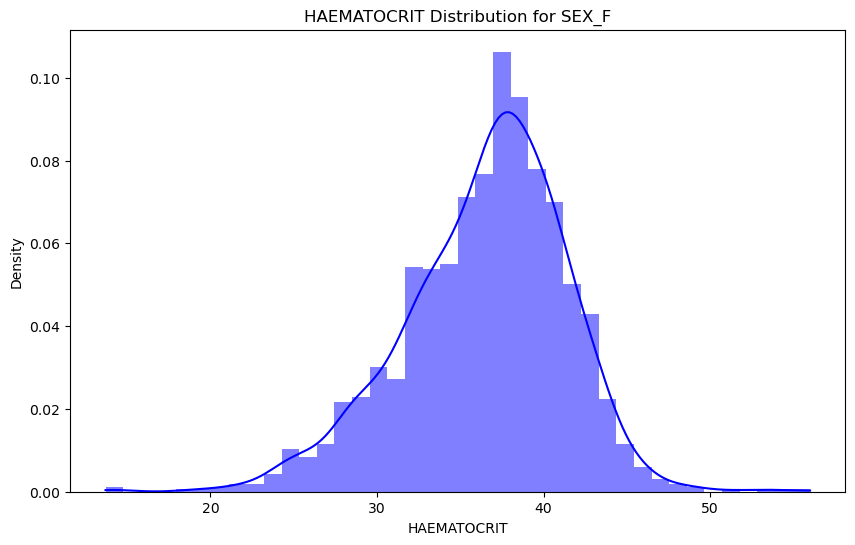

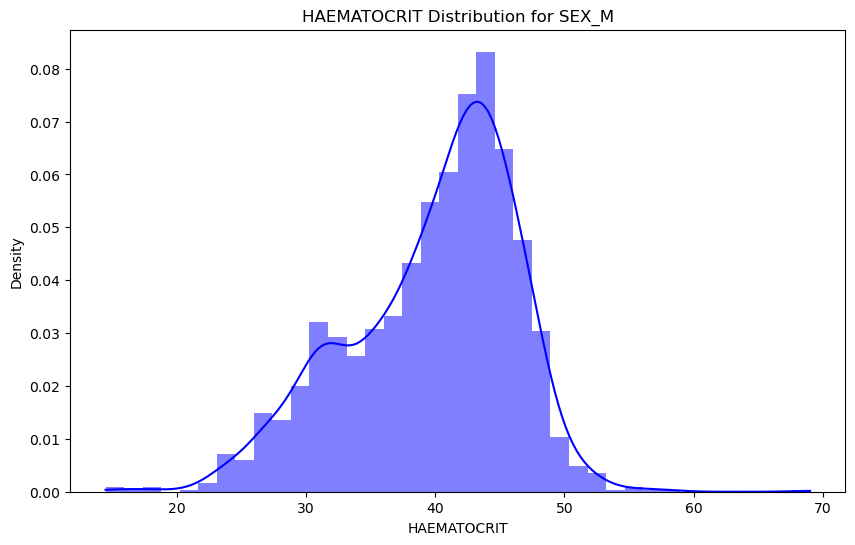

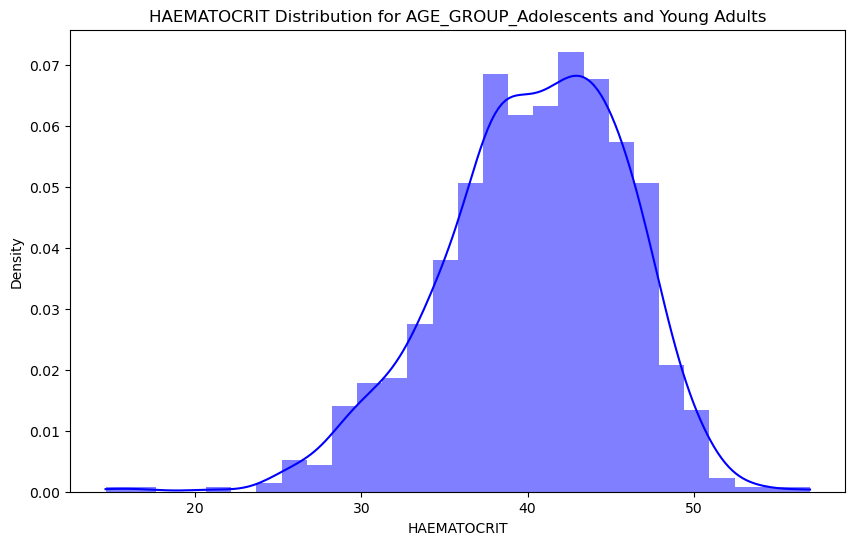

...

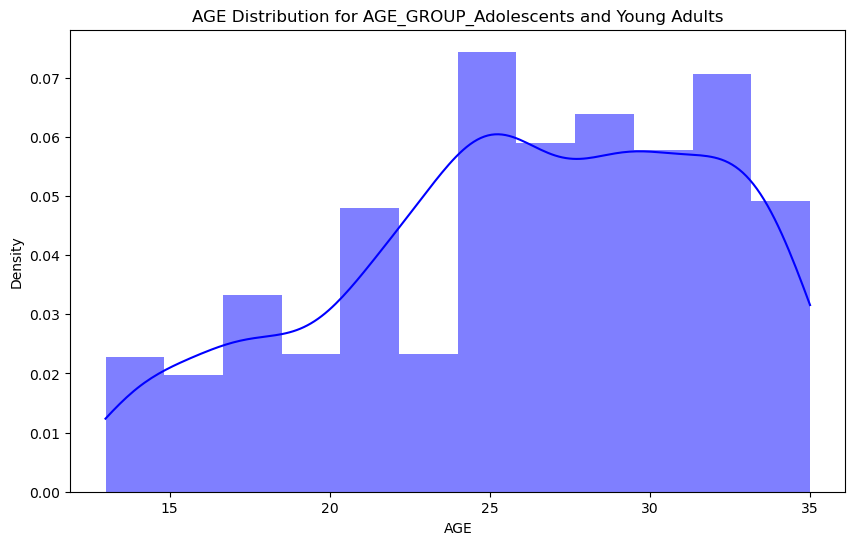

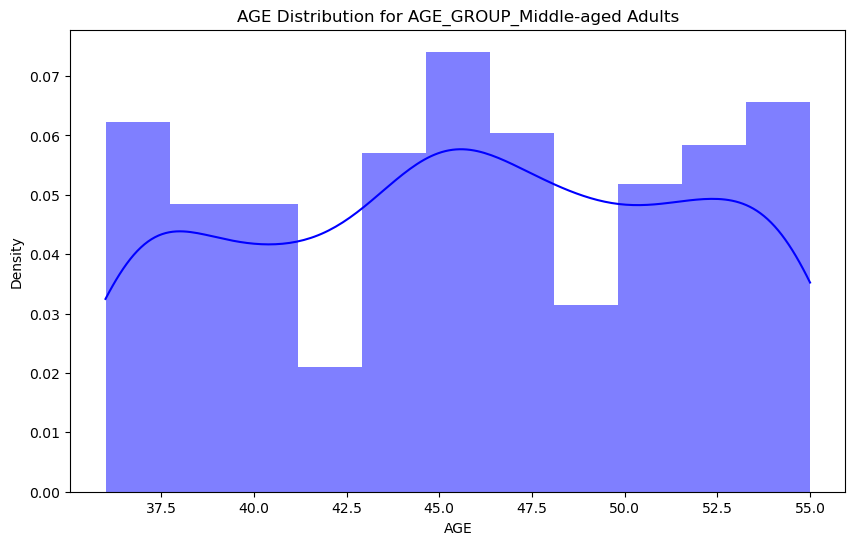

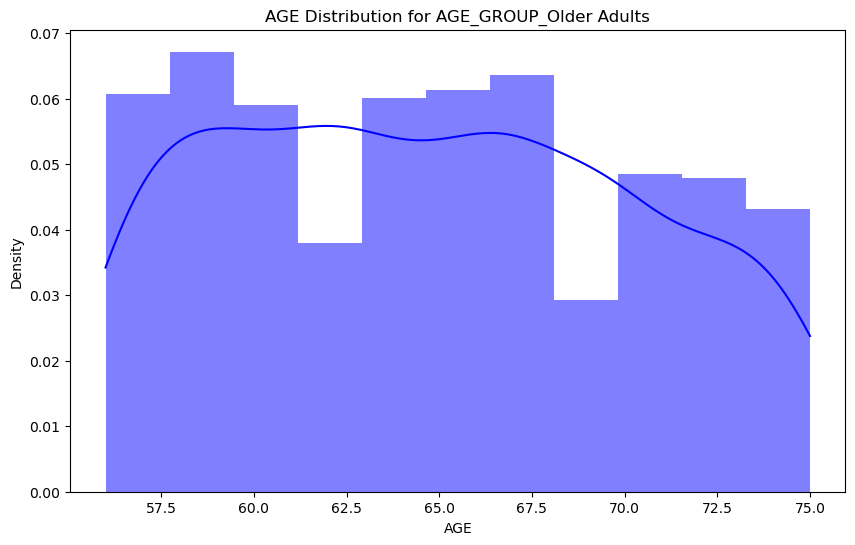

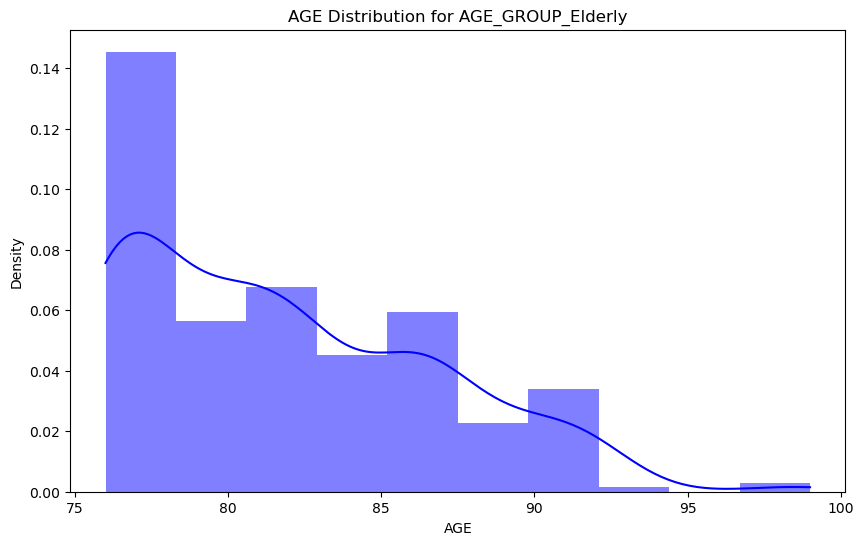

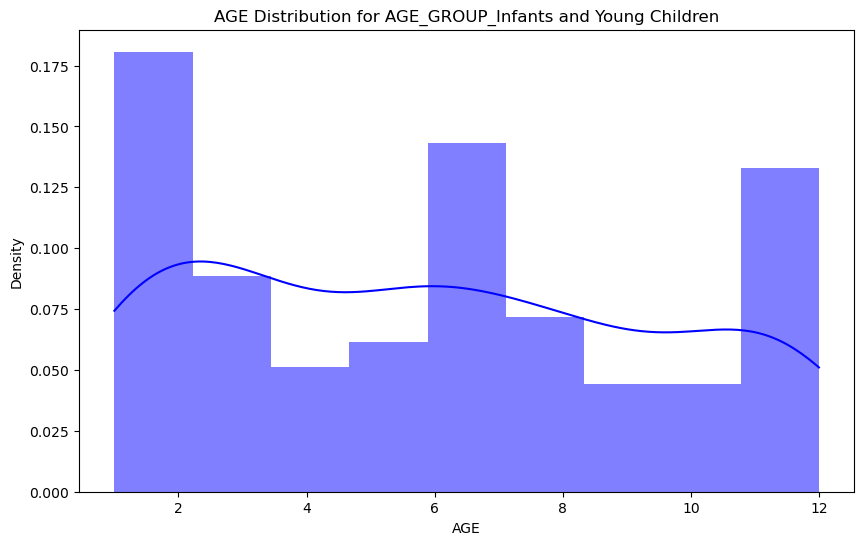

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_excel(r"C:\Users\akp24\docassist-main\data\raw\dataset.xlsx")

# Define the processed data path for statistics
processed_data_path = r"C:\Users\akp24\docassist-main\data\processed"

# Define the visuals path for saving plots
visuals_path = r"C:\Users\akp24\docassist-main\visuals"

# Summary statistics for the entire dataset
summary_statistics = df.describe()
display(summary_statistics)
summary_statistics.to_csv(f"{processed_data_path}/summary_statistics.csv")

# Source-based summary statistics
source_summary_statistics = df.groupby('SOURCE', observed=True).describe()
display(source_summary_statistics)
source_summary_statistics.to_csv(f"{processed_data_path}/source_summary_statistics.csv")

# Sex-based summary statistics
sex_summary_statistics = df.groupby('SEX', observed=True).describe()
display(sex_summary_statistics)
sex_summary_statistics.to_csv(f"{processed_data_path}/sex_summary_statistics.csv")

# Age group-based summary statistics
age_bins = [0, 12, 35, 55, 75, 100]
age_labels = ['Infants and Young Children', 'Adolescents and Young Adults', 'Middle-aged Adults', 'Older Adults', 'Elderly']
df['AGE_GROUP'] = pd.cut(df['AGE'], bins=age_bins, labels=age_labels)
age_group_summary_statistics = df.groupby('AGE_GROUP', observed=True).describe()
display(age_group_summary_statistics)
age_group_summary_statistics.to_csv(f"{processed_data_path}/age_group_summary_statistics.csv")

# Visualization function to display and save plots
def save_hist_density_plots(data, column, groupby, group_name, group_value, save_path):
    plt.figure(figsize=(10, 6))
    sns.histplot(data[column], kde=True, color='blue', stat="density", linewidth=0)
    plt.title(f"{column} Distribution for {group_name}_{group_value}")
    plt.show()  # Display the plot in the notebook
    plt.savefig(f"{save_path}/{column}_{group_name}_{group_value}_hist_density.png")
    plt.close()

# Save and display plots for each grouping
groupings = {
    'SOURCE': df['SOURCE'].unique(),
    'SEX': df['SEX'].unique(),
    'AGE_GROUP': df['AGE_GROUP'].unique()
}

for column in df.columns:
    if column not in ['SOURCE', 'SEX', 'AGE_GROUP']:  # Skip these columns
        for group_name, group_values in groupings.items():
            for group_value in group_values:
                data_subset = df[df[group_name] == group_value]
                save_hist_density_plots(data_subset, column, group_name, group_name, group_value, visuals_path)


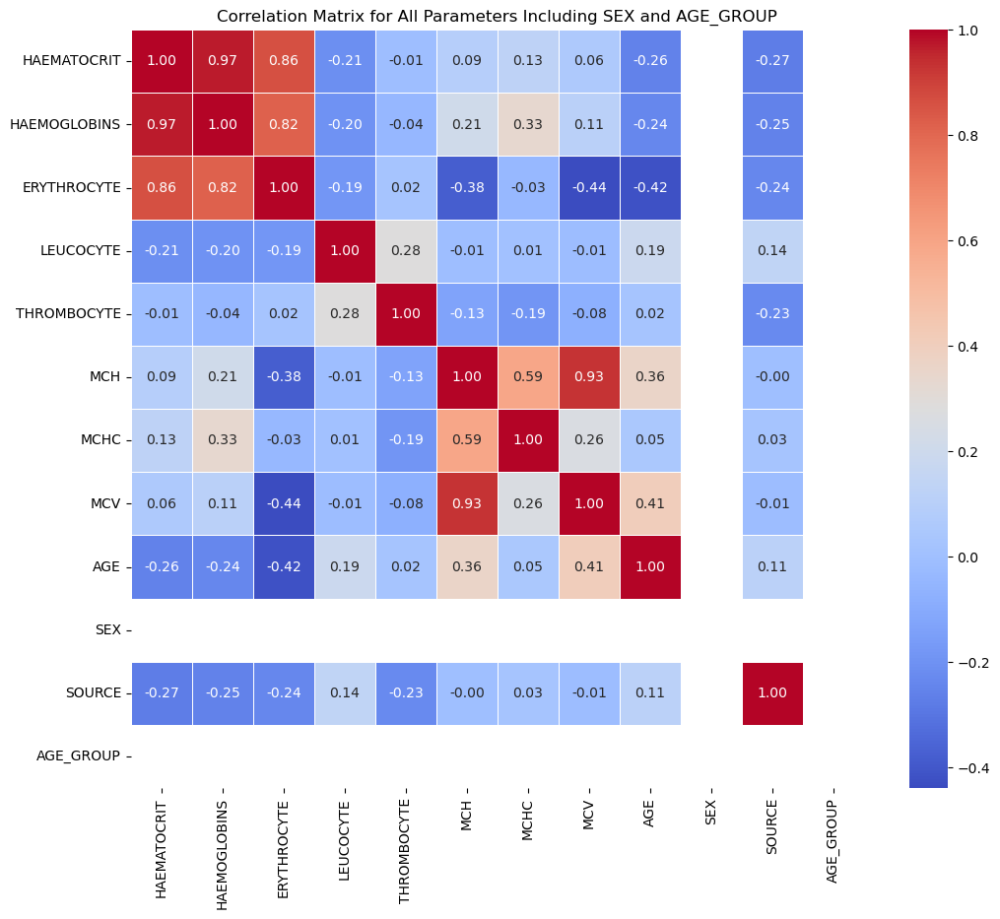

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Convert 'SEX' column from categorical (M/F) to numerical (0/1)
df['SEX'] = df['SEX'].map({'F': 0, 'M': 1})

# Convert 'AGE_GROUP' to numerical categories
age_group_mapping = {
    'Infants and Young Children': 1,
    'Adolescents and Young Adults': 2,
    'Middle-aged Adults': 3,
    'Older Adults': 4,
    'Elderly': 5
}
df['AGE_GROUP'] = df['AGE_GROUP'].map(age_group_mapping)

# Select only numeric columns
numeric_df = df.select_dtypes(include=[int, float])

# Calculate the correlation matrix for all numeric parameters
correlation_matrix = numeric_df.corr()

# paths for saving the outputs
processed_data_path = r"C:\Users\akp24\docassist-main\data\processed"
visuals_path = r"C:\Users\akp24\docassist-main\visuals"

# Save the correlation matrix 
correlation_matrix.to_csv(f"{processed_data_path}/correlation_matrix.csv", index=True)

# Visualize the correlation matrix using a heatmap and save the plot
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix for All Parameters Including SEX and AGE_GROUP')
plt.savefig(f"{visuals_path}/correlation_matrix_heatmap.png")
plt.show()


In [36]:
import pandas as pd
from scipy import stats
from IPython.display import display

# Convert 'SEX' column from categorical (M/F) to numerical (0/1)
df['SEX'] = df['SEX'].map({'F': 0, 'M': 1})

# Convert 'AGE_GROUP' to numerical categories
age_group_mapping = {
    'Infants and Young Children': 1,
    'Adolescents and Young Adults': 2,
    'Middle-aged Adults': 3,
    'Older Adults': 4,
    'Elderly': 5
}
df['AGE_GROUP'] = df['AGE_GROUP'].map(age_group_mapping)

# Define paths for saving the results
processed_data_path = r"C:\Users\akp24\docassist-main\data\processed"

# Function to perform t-tests and save results
def perform_t_tests(df, group_column, file_name):
    results = []
    numeric_columns = df.select_dtypes(include=[int, float]).columns
    
    for column in numeric_columns:
        if column != group_column:
            groups = df[group_column].unique()
            if len(groups) == 2:  # t-test is valid only for two groups
                group1 = df[df[group_column] == groups[0]][column]
                group2 = df[df[group_column] == groups[1]][column]
                if len(group1) > 1 and len(group2) > 1:  # Ensure groups have more than one value
                    t_stat, p_val = stats.ttest_ind(group1, group2)
                    results.append([column, t_stat, p_val])
                else:
                    results.append([column, float('nan'), float('nan')])

    # Create DataFrame for results
    results_df = pd.DataFrame(results, columns=['Parameter', 't-statistic', 'p-value'])
    
    # Save results to CSV
    results_df.to_csv(f"{processed_data_path}/{file_name}", index=False)
    
    # Display the results in the notebook
    display(results_df)

# Function to perform ANOVA and save results
def perform_anova(df, group_column, file_name):
    results = []
    numeric_columns = df.select_dtypes(include=[int, float]).columns
    
    for column in numeric_columns:
        if column != group_column:
            groups = [df[df[group_column] == group][column] for group in df[group_column].unique()]
            groups = [group for group in groups if len(group) > 1]  # Filter out groups with only one value
            if len(groups) > 1:  # Ensure there are at least two groups with more than one value
                f_stat, p_val = stats.f_oneway(*groups)
                results.append([column, f_stat, p_val])
            else:
                results.append([column, float('nan'), float('nan')])

    # Create DataFrame for results
    results_df = pd.DataFrame(results, columns=['Parameter', 'F-statistic', 'p-value'])
    
    # Save results to CSV
    results_df.to_csv(f"{processed_data_path}/{file_name}", index=False)
    
    # Display the results in the notebook
    display(results_df)

# Comparisons by SOURCE using t-tests
perform_t_tests(df, 'SOURCE', 'source_comparison_t_tests.csv')

# Comparisons by SEX using t-tests
perform_t_tests(df, 'SEX', 'sex_comparison_t_tests.csv')

# Comparisons by AGE_GROUP using ANOVA (since there are more than two groups)
perform_anova(df, 'AGE_GROUP', 'age_group_comparison_anova.csv')


,Parameter,t-statistic,p-value
0,HAEMATOCRIT,-16.277158,2.299755e-57
1,HAEMOGLOBINS,-15.162566,2.950155e-50
2,ERYTHROCYTE,-14.094352,7.461976e-44
3,LEUCOCYTE,8.112589,6.912999e-16
4,THROMBOCYTE,-13.562764,8.061799e-41
5,MCH,-0.124599,9.008488e-01
6,MCHC,1.497159,1.344472e-01
7,MCV,-0.782163,4.341749e-01
8,AGE,6.569087,5.858167e-11
9,SEX,NaN,NaN


,Parameter,t-statistic,p-value


,Parameter,F-statistic,p-value
0,HAEMATOCRIT,NaN,NaN
1,HAEMOGLOBINS,NaN,NaN
2,ERYTHROCYTE,NaN,NaN
3,LEUCOCYTE,NaN,NaN
4,THROMBOCYTE,NaN,NaN
5,MCH,NaN,NaN
6,MCHC,NaN,NaN
7,MCV,NaN,NaN
8,AGE,NaN,NaN
9,SEX,NaN,NaN


In [38]:
# Check group counts for SEX, AGE_GROUP, and SOURCE
print(df['SEX'].value_counts())
print(df['AGE_GROUP'].value_counts())
print(df['SOURCE'].value_counts())


Series([], Name: count, dtype: int64)
Series([], Name: count, dtype: int64)
SOURCE
0    1992
1    1317
Name: count, dtype: int64


In [40]:
# Check for unique values and counts in SEX and AGE_GROUP
print("SEX column unique values and counts:")
print(df['SEX'].value_counts(dropna=False))

print("AGE_GROUP column unique values and counts:")
print(df['AGE_GROUP'].value_counts(dropna=False))


SEX column unique values and counts:
SEX
NaN    3309
Name: count, dtype: int64
AGE_GROUP column unique values and counts:
AGE_GROUP
NaN    3309
Name: count, dtype: int64


In [42]:
# Check original unique values before mapping
print("Original SEX values:")
print(df['SEX'].unique())

print("Original AGE_GROUP values:")
print(df['AGE_GROUP'].unique())

# Apply the correct mapping
df['SEX'] = df['SEX'].map({'F': 0, 'M': 1})

age_group_mapping = {
    'Infants and Young Children': 1,
    'Adolescents and Young Adults': 2,
    'Middle-aged Adults': 3,
    'Older Adults': 4,
    'Elderly': 5
}
df['AGE_GROUP'] = df['AGE_GROUP'].map(age_group_mapping)

# Verify the mapping
print("Mapped SEX values:")
print(df['SEX'].unique())

print("Mapped AGE_GROUP values:")
print(df['AGE_GROUP'].unique())


Original SEX values:
[nan]
Original AGE_GROUP values:
[nan]
Mapped SEX values:
[nan]
Mapped AGE_GROUP values:
[nan]


In [44]:
# Check for missing values in the original columns
print("Missing values in SEX before mapping:")
print(df['SEX'].isnull().sum())

print("Missing values in AGE_GROUP before mapping:")
print(df['AGE_GROUP'].isnull().sum())


Missing values in SEX before mapping:
3309
Missing values in AGE_GROUP before mapping:
3309


In [48]:
import pandas as pd

# Load the original dataset
df = pd.read_excel(r"C:\Users\akp24\docassist-main\data\raw\dataset.xlsx")

# Check for missing values in the original SEX and AGE columns
print("Missing values in SEX before mapping:")
print(df['SEX'].isnull().sum())

print("Missing values in AGE before categorizing:")
print(df['AGE'].isnull().sum())

# Map 'SEX' column from categorical values to numerical (0/1)
df['SEX'] = df['SEX'].map({'F': 0, 'M': 1})

# Create 'AGE_GROUP' column based on 'AGE'
age_group_mapping = {
    'Infants and Young Children': [0, 12],
    'Adolescents and Young Adults': [13, 35],
    'Middle-aged Adults': [36, 55],
    'Older Adults': [56, 75],
    'Elderly': [76, 120]
}

def categorize_age(age):
    for group, (low, high) in age_group_mapping.items():
        if low <= age <= high:
            return group
    return None

df['AGE_GROUP'] = df['AGE'].apply(categorize_age)

# Map 'AGE_GROUP' to numerical categories
age_group_numeric_mapping = {
    'Infants and Young Children': 1,
    'Adolescents and Young Adults': 2,
    'Middle-aged Adults': 3,
    'Older Adults': 4,
    'Elderly': 5
}
df['AGE_GROUP'] = df['AGE_GROUP'].map(age_group_numeric_mapping)

# Verify the mapping
print("Mapped SEX values:")
print(df['SEX'].unique())

print("Mapped AGE_GROUP values:")
print(df['AGE_GROUP'].unique())

# Proceed with the statistical tests as before


Missing values in SEX before mapping:
0
Missing values in AGE before categorizing:
0
Mapped SEX values:
[0 1]
Mapped AGE_GROUP values:
[2 3 4 5 1]


In [50]:
import pandas as pd
from scipy import stats
from IPython.display import display

processed_data_path = r"C:\Users\akp24\docassist-main\data\processed"

# Function to perform t-tests and save results
def perform_t_tests(df, group_column, file_name):
    results = []
    numeric_columns = df.select_dtypes(include=[int, float]).columns
    
    for column in numeric_columns:
        if column != group_column:
            groups = df[group_column].unique()
            if len(groups) == 2:  # t-test is valid only for two groups
                group1 = df[df[group_column] == groups[0]][column]
                group2 = df[df[group_column] == groups[1]][column]
                if len(group1) > 1 and len(group2) > 1:  # Ensure groups have more than one value
                    t_stat, p_val = stats.ttest_ind(group1, group2)
                    results.append([column, t_stat, p_val])
                else:
                    results.append([column, float('nan'), float('nan')])

    # Create DataFrame for results
    results_df = pd.DataFrame(results, columns=['Parameter', 't-statistic', 'p-value'])
    
    # Save results
    results_df.to_csv(f"{processed_data_path}/{file_name}", index=False)
    
    display(results_df)

# Function to perform ANOVA and save results
def perform_anova(df, group_column, file_name):
    results = []
    numeric_columns = df.select_dtypes(include=[int, float]).columns
    
    for column in numeric_columns:
        if column != group_column:
            groups = [df[df[group_column] == group][column] for group in df[group_column].unique()]
            groups = [group for group in groups if len(group) > 1]  # Filter out groups with only one value
            if len(groups) > 1:  # Ensure there are at least two groups with more than one value
                f_stat, p_val = stats.f_oneway(*groups)
                results.append([column, f_stat, p_val])
            else:
                results.append([column, float('nan'), float('nan')])

    # Create DataFrame for results
    results_df = pd.DataFrame(results, columns=['Parameter', 'F-statistic', 'p-value'])
    
    # Save results
    results_df.to_csv(f"{processed_data_path}/{file_name}", index=False)
    
    display(results_df)

# Comparisons by SOURCE using t-tests
perform_t_tests(df, 'SOURCE', 'source_comparison_t_tests.csv')

# Comparisons by SEX using t-tests
perform_t_tests(df, 'SEX', 'sex_comparison_t_tests.csv')

# Comparisons by AGE_GROUP using ANOVA (since there are more than two groups)
perform_anova(df, 'AGE_GROUP', 'age_group_comparison_anova.csv')


,Parameter,t-statistic,p-value
0,HAEMATOCRIT,-16.277158,2.299755e-57
1,HAEMOGLOBINS,-15.162566,2.950155e-50
2,ERYTHROCYTE,-14.094352,7.461976e-44
3,LEUCOCYTE,8.112589,6.912999e-16
4,THROMBOCYTE,-13.562764,8.061799e-41
5,MCH,-0.124599,9.008488e-01
6,MCHC,1.497159,1.344472e-01
7,MCV,-0.782163,4.341749e-01
8,AGE,6.569087,5.858167e-11
9,SEX,3.296132,9.906066e-04


,Parameter,t-statistic,p-value
0,HAEMATOCRIT,-16.482788,1.008463e-58
1,HAEMOGLOBINS,-18.873976,1.522818e-75
2,ERYTHROCYTE,-14.534923,1.911190e-46
3,LEUCOCYTE,-2.301571,2.142125e-02
4,THROMBOCYTE,3.955562,7.795667e-05
5,MCH,-4.835646,1.387681e-06
6,MCHC,-12.954882,1.772896e-37
7,MCV,-0.009297,9.925825e-01
8,AGE,-0.934303,3.502157e-01
9,SOURCE,-3.296132,9.906066e-04


,Parameter,F-statistic,p-value
0,HAEMATOCRIT,86.847255,2.968087e-70
1,HAEMOGLOBINS,76.187375,7.055267e-62
2,ERYTHROCYTE,180.002031,1.071226e-139
3,LEUCOCYTE,35.808779,2.483583e-29
4,THROMBOCYTE,14.453805,1.053571e-11
5,MCH,126.323640,1.744310e-100
6,MCHC,2.782379,2.531039e-02
7,MCV,167.508518,9.332432e-131
8,AGE,12154.989050,0.000000e+00
9,SEX,2.116151,7.622178e-02


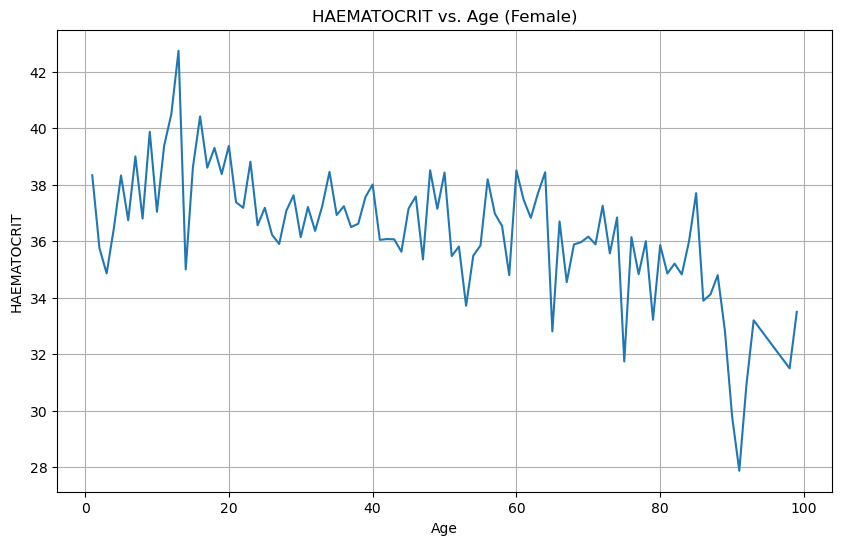

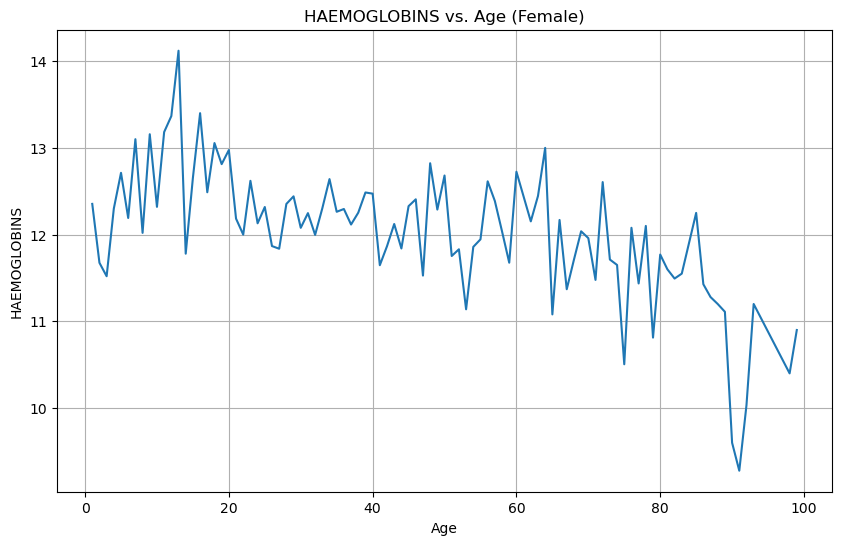

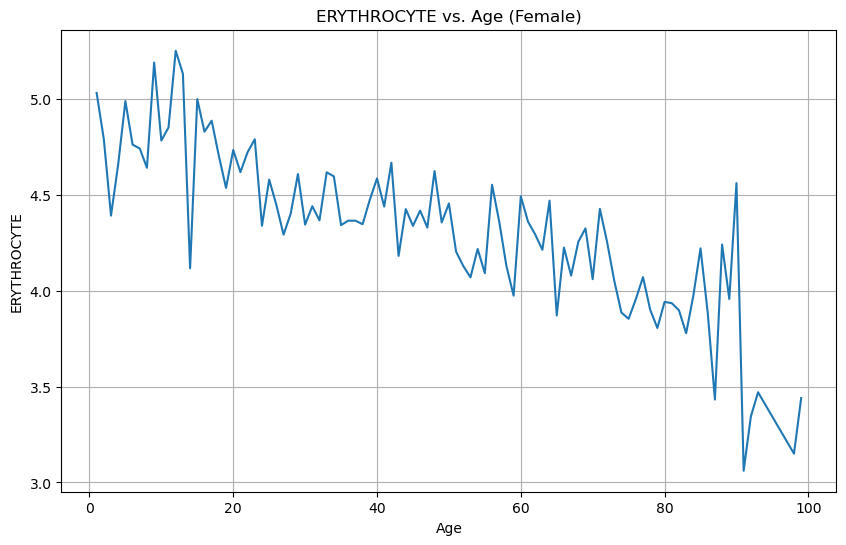

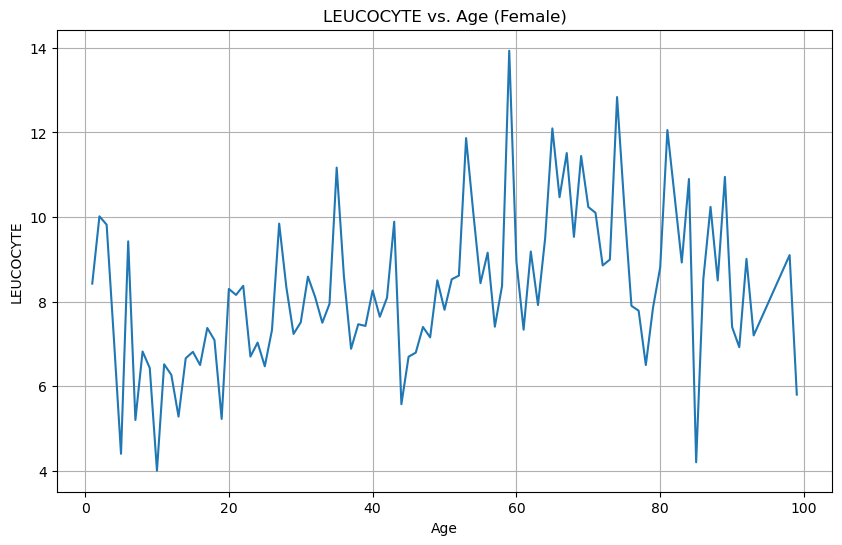

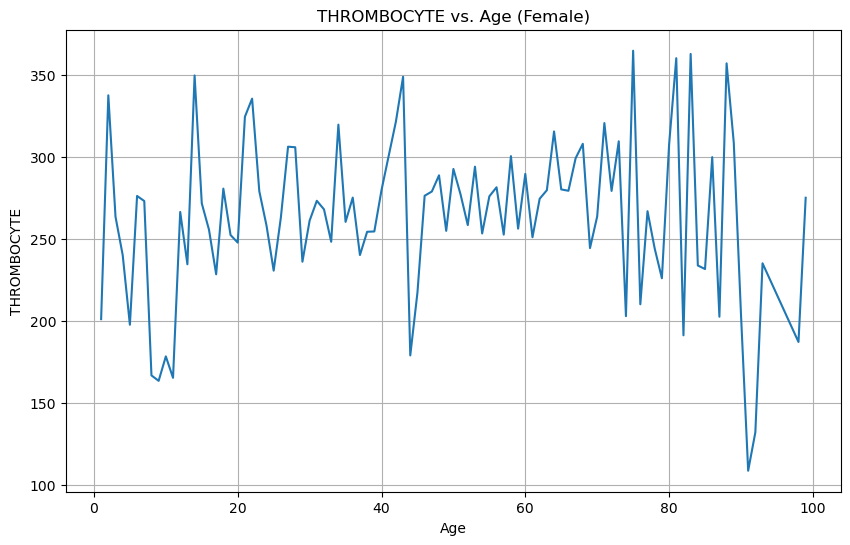

...

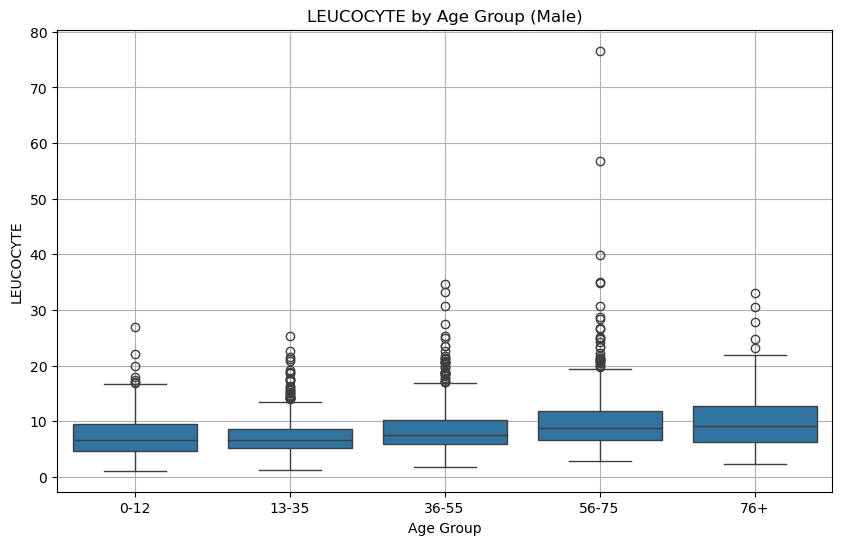

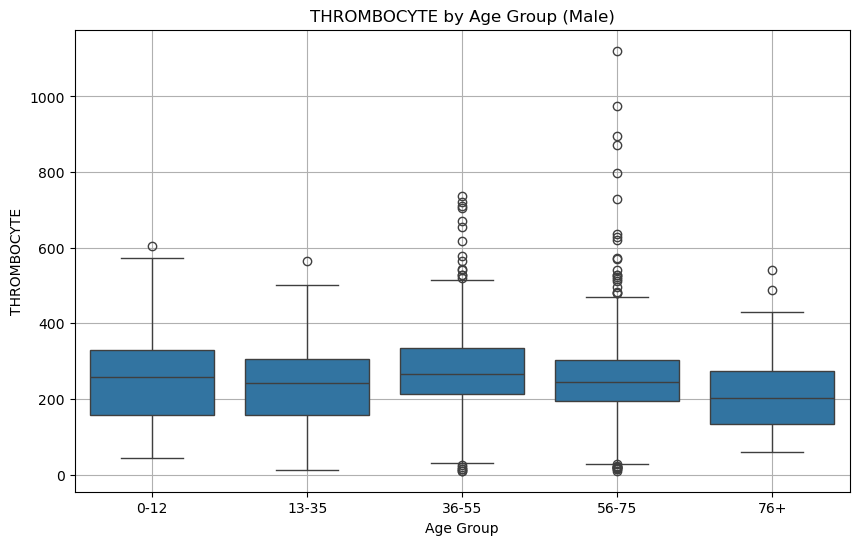

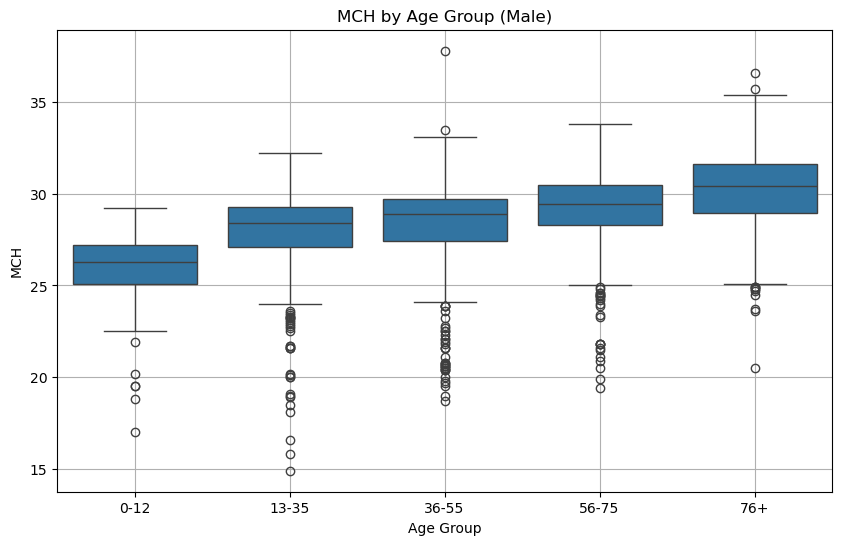

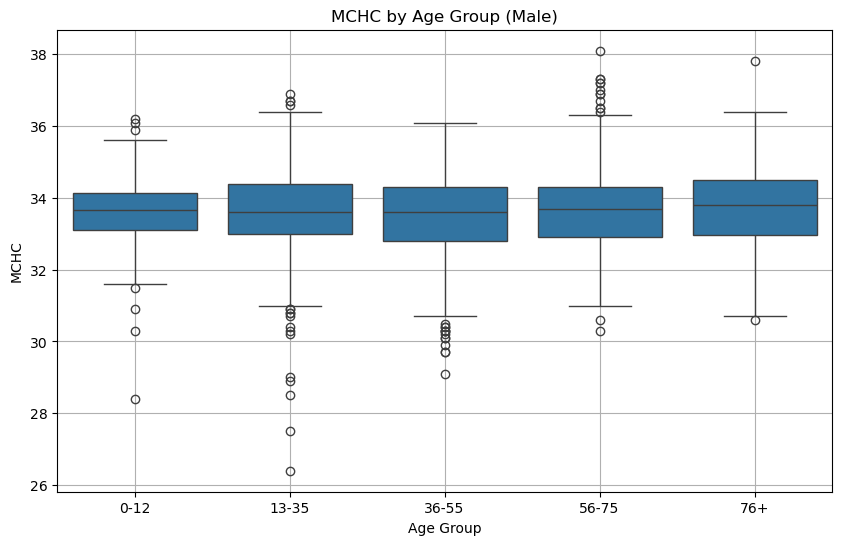

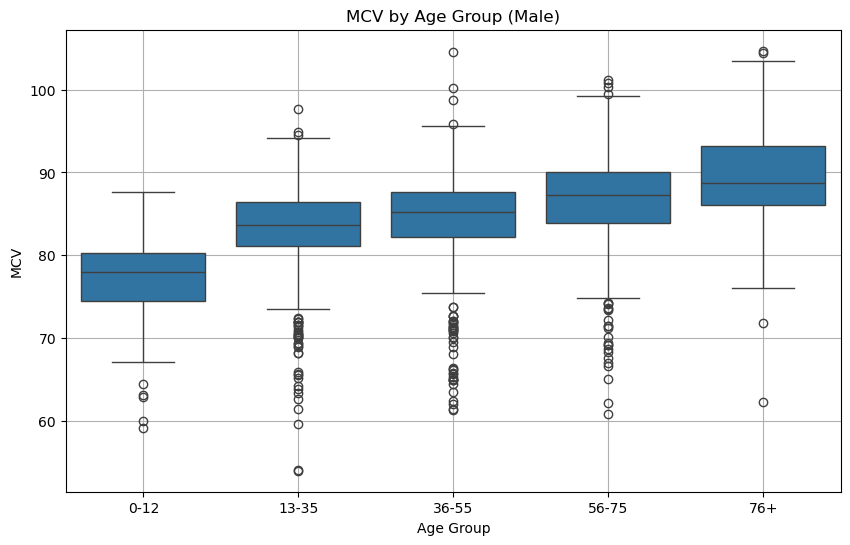

,SEX,Parameter,Correlation with Age
0,Female,HAEMATOCRIT,-0.203145
1,Female,HAEMOGLOBINS,-0.182346
2,Female,ERYTHROCYTE,-0.385368
3,Female,LEUCOCYTE,0.158168
4,Female,THROMBOCYTE,0.037687
5,Female,MCH,0.342313
6,Female,MCHC,0.057858
7,Female,MCV,0.384013
8,Male,HAEMATOCRIT,-0.327591
9,Male,HAEMOGLOBINS,-0.318501


,SEX,Parameter,Slope,Intercept,R-squared,P-value
0,Female,HAEMATOCRIT,-0.044348,38.542392,0.041268,4.763895e-16
1,Female,HAEMOGLOBINS,-0.013705,12.697855,0.033250,3.562507e-13
2,Female,ERYTHROCYTE,-0.011540,4.875954,0.148509,1.313049e-56
3,Female,LEUCOCYTE,0.033937,6.934752,0.025017,3.098091e-10
4,Female,THROMBOCYTE,0.187273,258.384141,0.001420,1.360410e-01
5,Female,MCH,0.043371,25.984945,0.117178,2.760147e-44
6,Female,MCHC,0.003232,32.897818,0.003348,2.203925e-02
7,Female,MCV,0.125244,78.815193,0.147466,3.431095e-56
8,Male,HAEMATOCRIT,-0.097928,44.386308,0.107316,7.023600e-45
9,Male,HAEMOGLOBINS,-0.032878,14.910004,0.101443,2.176119e-42


In [56]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from IPython.display import display

df = pd.read_excel(r"C:\Users\akp24\docassist-main\data\raw\dataset.xlsx")

# Set the paths to save visualizations and processed data
visuals_path = r"C:\Users\akp24\docassist-main\visuals"
processed_data_path = r"C:\Users\akp24\docassist-main\data\processed"

# Ensure SEX is mapped correctly
df['SEX'] = df['SEX'].map({'F': 0, 'M': 1})

# Create age groups
age_bins = [0, 12, 35, 55, 75, 100]
age_labels = ['0-12', '13-35', '36-55', '56-75', '76+']
df['AGE_GROUP'] = pd.cut(df['AGE'], bins=age_bins, labels=age_labels)

# Define parameters to analyze
parameters = ['HAEMATOCRIT', 'HAEMOGLOBINS', 'ERYTHROCYTE', 'LEUCOCYTE', 'THROMBOCYTE', 'MCH', 'MCHC', 'MCV']

# Initialize DataFrames to store correlation and regression results
correlation_results = []
regression_results = []

for sex in [0, 1]:
    sex_label = 'Female' if sex == 0 else 'Male'
    df_sex = df[df['SEX'] == sex]

    # 1. Line Plots for Age-Related Trends
    for param in parameters:
        plt.figure(figsize=(10, 6))
        sns.lineplot(data=df_sex, x='AGE', y=param, errorbar=None)
        plt.title(f'{param} vs. Age ({sex_label})')
        plt.xlabel('Age')
        plt.ylabel(param)
        plt.grid(True)
        plt.savefig(f"{visuals_path}/{param}_vs_Age_{sex_label}_lineplot.png")
        plt.show()

    # 2. Scatter Plots with Regression Lines
    for param in parameters:
        plt.figure(figsize=(10, 6))
        sns.regplot(x='AGE', y=param, data=df_sex, scatter_kws={'s':10}, line_kws={'color':'red'})
        plt.title(f'{param} vs. Age with Regression Line ({sex_label})')
        plt.xlabel('Age')
        plt.ylabel(param)
        plt.grid(True)
        plt.savefig(f"{visuals_path}/{param}_vs_Age_{sex_label}_scatterplot.png")
        plt.show()

    # 3. Box Plots for Age Groups
    for param in parameters:
        plt.figure(figsize=(10, 6))
        sns.boxplot(x='AGE_GROUP', y=param, data=df_sex)
        plt.title(f'{param} by Age Group ({sex_label})')
        plt.xlabel('Age Group')
        plt.ylabel(param)
        plt.grid(True)
        plt.savefig(f"{visuals_path}/{param}_by_Age_Group_{sex_label}_boxplot.png")
        plt.show()

    # 4. Correlation between Age and Parameters
    for param in parameters:
        corr, _ = stats.pearsonr(df_sex['AGE'], df_sex[param])
        correlation_results.append({'SEX': sex_label, 'Parameter': param, 'Correlation with Age': corr})

    # 5. Linear Regression for each parameter
    for param in parameters:
        slope, intercept, r_value, p_value, std_err = stats.linregress(df_sex['AGE'], df_sex[param])
        regression_results.append({
            'SEX': sex_label,
            'Parameter': param,
            'Slope': slope,
            'Intercept': intercept,
            'R-squared': r_value**2,
            'P-value': p_value
        })

# Convert to DataFrame and save correlation results
correlation_df = pd.DataFrame(correlation_results)
correlation_df.to_csv(f"{processed_data_path}/age_correlation_by_sex.csv", index=False)
display(correlation_df)

# Convert to DataFrame and save regression results
regression_df = pd.DataFrame(regression_results)
regression_df.to_csv(f"{processed_data_path}/age_regression_results_by_sex.csv", index=False)
display(regression_df)


Missing values in each column:


HAEMATOCRIT     0
HAEMOGLOBINS    0
ERYTHROCYTE     0
LEUCOCYTE       0
THROMBOCYTE     0
MCH             0
MCHC            0
MCV             0
AGE             0
SEX             0
SOURCE          0
AGE_GROUP       0
dtype: int64

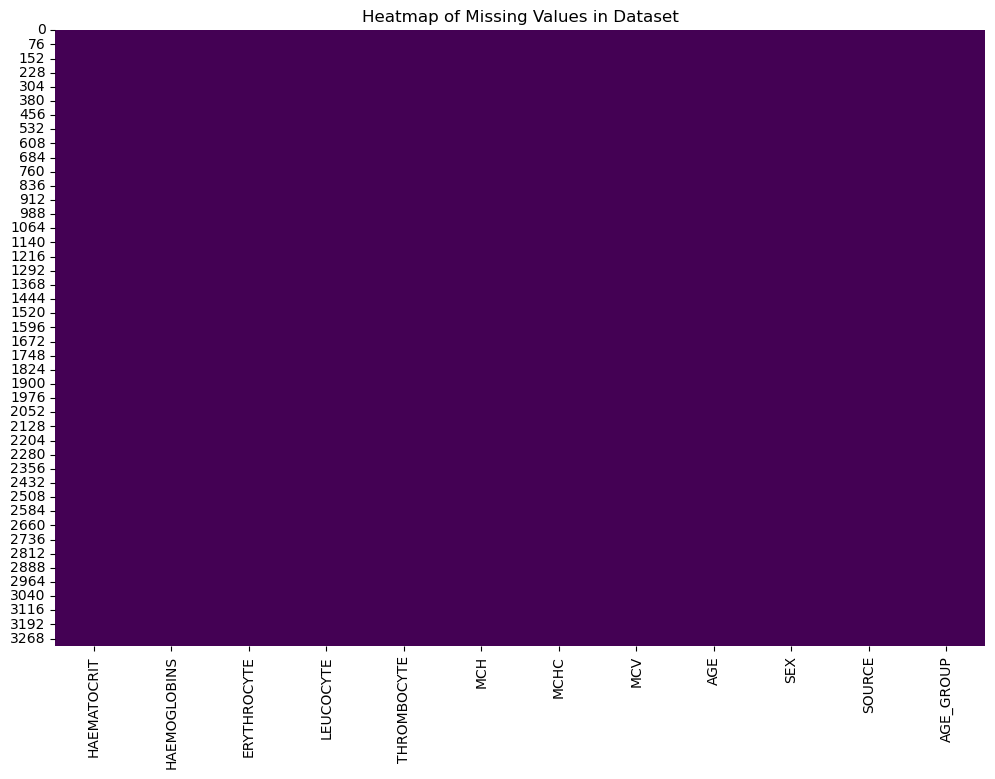

In [58]:
# Check for missing values in the entire dataset
missing_values = df.isnull().sum()

# Display the number of missing values for each column
print("Missing values in each column:")
display(missing_values)

# Visualize missing data
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title('Heatmap of Missing Values in Dataset')
plt.show()

# Save the missing values summary to a CSV file
missing_values.to_csv(f"{processed_data_path}/missing_values_summary.csv")


In [60]:
import numpy as np

# Function to detect outliers using Z-score method
def detect_outliers_zscore(df, threshold=3):
    z_scores = np.abs(stats.zscore(df.select_dtypes(include=[np.number])))
    outliers = (z_scores > threshold)
    return outliers

# Function to detect outliers using IQR method
def detect_outliers_iqr(df):
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1
    outliers = ((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR)))
    return outliers

# Detecting outliers
outliers_zscore = detect_outliers_zscore(df[parameters])
outliers_iqr = detect_outliers_iqr(df[parameters])

# Count of outliers detected
outliers_zscore_count = outliers_zscore.sum()
outliers_iqr_count = outliers_iqr.sum()

# Displaying the count of outliers for each parameter
print("Outliers detected using Z-score method:")
display(outliers_zscore_count)
print("Outliers detected using IQR method:")
display(outliers_iqr_count)

# Save outlier results to CSV
outliers_zscore.to_csv(f"{processed_data_path}/outliers_zscore.csv")
outliers_iqr.to_csv(f"{processed_data_path}/outliers_iqr.csv")


Outliers detected using Z-score method:


HAEMATOCRIT     12
HAEMOGLOBINS    10
ERYTHROCYTE     25
LEUCOCYTE       49
THROMBOCYTE     34
MCH             66
MCHC            41
MCV             50
dtype: int64

Outliers detected using IQR method:


HAEMATOCRIT      21
HAEMOGLOBINS     19
ERYTHROCYTE      46
LEUCOCYTE       187
THROMBOCYTE      61
MCH             204
MCHC            126
MCV             176
dtype: int64

In [62]:
# Function to flag outliers using Z-score method
def flag_outliers_zscore(df, threshold=3):
    z_scores = np.abs(stats.zscore(df.select_dtypes(include=[np.number])))
    outliers = (z_scores > threshold)
    return outliers

# Function to flag outliers using IQR method
def flag_outliers_iqr(df):
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1
    outliers = ((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR)))
    return outliers

# Detect and flag outliers using both methods
outliers_zscore = flag_outliers_zscore(df[parameters])
outliers_iqr = flag_outliers_iqr(df[parameters])

# Adding flags to the original dataframe
for column in parameters:
    df[f'{column}_outlier_zscore'] = outliers_zscore[column].astype(int)
    df[f'{column}_outlier_iqr'] = outliers_iqr[column].astype(int)

# Saving the updated dataframe with outlier flags
df.to_csv(f"{processed_data_path}/dataset_with_outlier_flags.csv", index=False)

display(df.head())


,HAEMATOCRIT,HAEMOGLOBINS,ERYTHROCYTE,LEUCOCYTE,THROMBOCYTE,MCH,MCHC,MCV,AGE,SEX,...,LEUCOCYTE_outlier_zscore,LEUCOCYTE_outlier_iqr,THROMBOCYTE_outlier_zscore,THROMBOCYTE_outlier_iqr,MCH_outlier_zscore,MCH_outlier_iqr,MCHC_outlier_zscore,MCHC_outlier_iqr,MCV_outlier_zscore,MCV_outlier_iqr
0,33.8,11.1,4.18,4.6,150,26.6,32.8,80.9,33,0,...,0,0,0,0,0,0,0,0,0,0
1,44.6,14.0,6.86,6.3,232,20.4,31.4,65.0,36,1,...,0,0,0,0,0,1,0,0,0,1
2,42.9,14.0,4.57,6.2,336,30.6,32.6,93.9,70,0,...,0,0,0,0,0,0,0,0,0,0
3,41.9,14.4,4.67,3.5,276,30.8,34.4,89.7,18,0,...,0,0,0,0,0,0,0,0,0,0
4,40.6,13.3,4.85,14.9,711,27.4,32.8,83.7,36,1,...,0,0,1,1,0,0,0,0,0,0


Cluster centers:


,HAEMATOCRIT,HAEMOGLOBINS,ERYTHROCYTE,LEUCOCYTE,THROMBOCYTE,MCH,MCHC,MCV
0,38.216694,12.756888,4.385146,8.490762,286.812804,29.142788,33.394084,87.291572
1,35.360465,11.219638,4.937804,8.997158,308.087855,22.856331,31.684238,72.051163
2,44.124906,14.892293,5.241992,7.230827,227.916353,28.480733,33.792011,84.284492
3,29.963782,10.029167,3.427997,11.516987,225.988782,29.330288,33.470513,87.658013


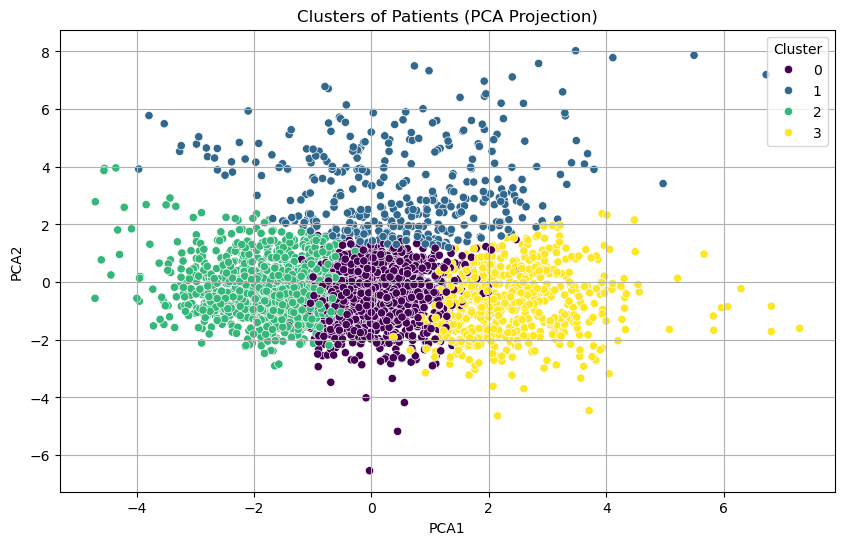

,Parameter,Z-score Outliers,IQR Outliers
HAEMATOCRIT,HAEMATOCRIT,12,21
HAEMOGLOBINS,HAEMOGLOBINS,10,19
ERYTHROCYTE,ERYTHROCYTE,25,46
LEUCOCYTE,LEUCOCYTE,49,187
THROMBOCYTE,THROMBOCYTE,34,61
MCH,MCH,66,204
MCHC,MCHC,41,126
MCV,MCV,50,176


In [68]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt

# Preprocessing: Scale the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df[parameters])

# Applying K-Means clustering for all parameters
kmeans = KMeans(n_clusters=4, random_state=42)  # Adjust the number of clusters as needed
df['Cluster'] = kmeans.fit_predict(df_scaled)

# Analyzing the clusters
cluster_centers = pd.DataFrame(scaler.inverse_transform(kmeans.cluster_centers_), columns=parameters)
print("Cluster centers:")
display(cluster_centers)

# Save cluster assignments to CSV
df[['Cluster']].to_csv(f"{processed_data_path}/cluster_assignments.csv", index=False)

# Save the cluster centers
cluster_centers.to_csv(f"{processed_data_path}/cluster_centers.csv", index=False)

# Dimensionality reduction using PCA for visualization
pca = PCA(n_components=2)  # Reduce to 2D for visualization
df_pca = pca.fit_transform(df_scaled)

#  PCA results DF
df_pca = pd.DataFrame(df_pca, columns=['PCA1', 'PCA2'])
df_pca['Cluster'] = df['Cluster']

# Plot the PCA results with cluster labels
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', data=df_pca, palette='viridis')
plt.title('Clusters of Patients (PCA Projection)')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.grid(True)
plt.savefig(f"{visuals_path}/clusters_pca_projection.png")
plt.show()

# Summarize the number of outliers detected by each method
outliers_summary = {
    'Parameter': parameters,
    'Z-score Outliers': outliers_zscore_count,
    'IQR Outliers': outliers_iqr_count
}
outliers_summary_df = pd.DataFrame(outliers_summary)

# Save the summary to CSV
outliers_summary_df.to_csv(f"{processed_data_path}/outliers_summary.csv", index=False)

# Display
display(outliers_summary_df)


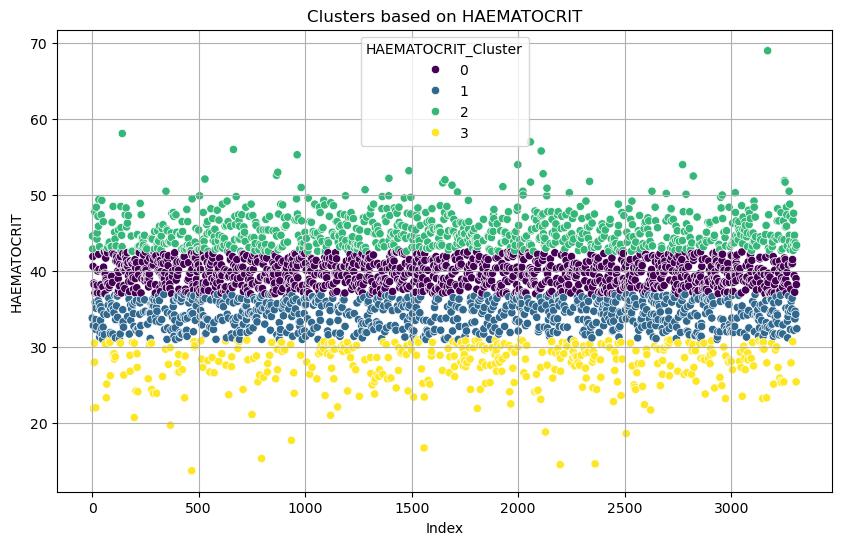

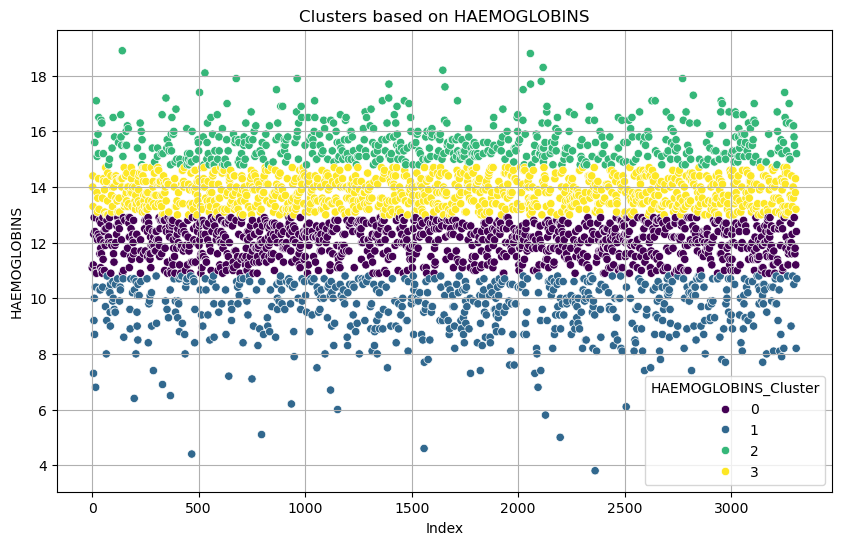

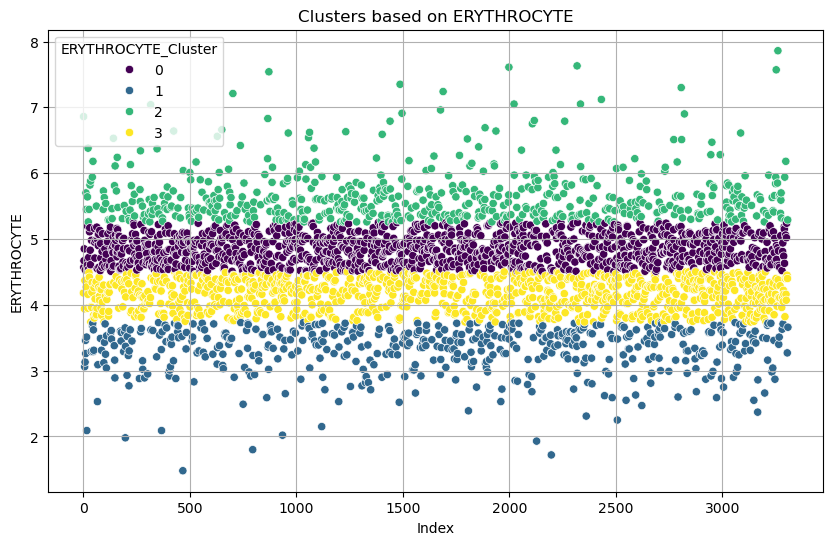

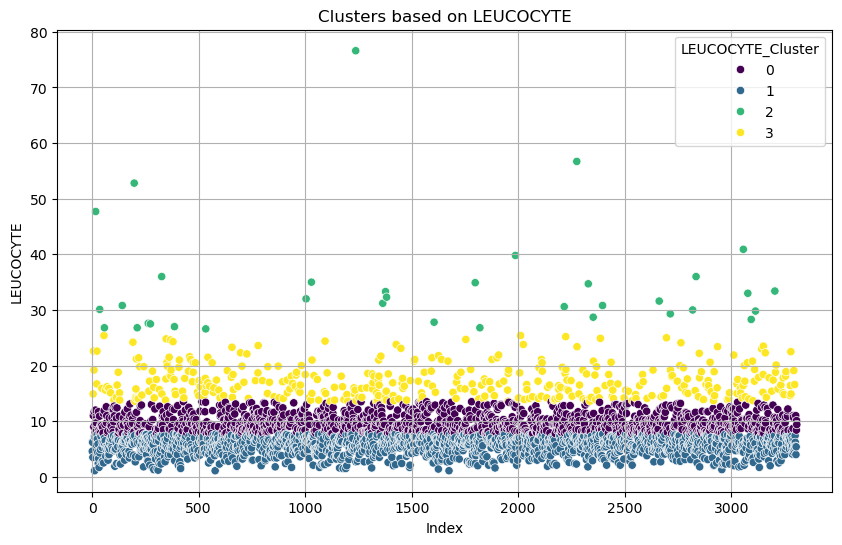

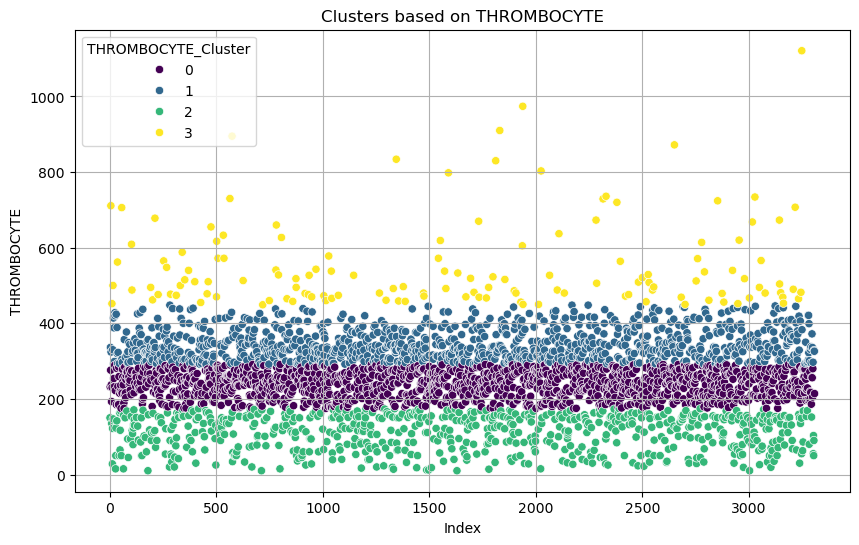

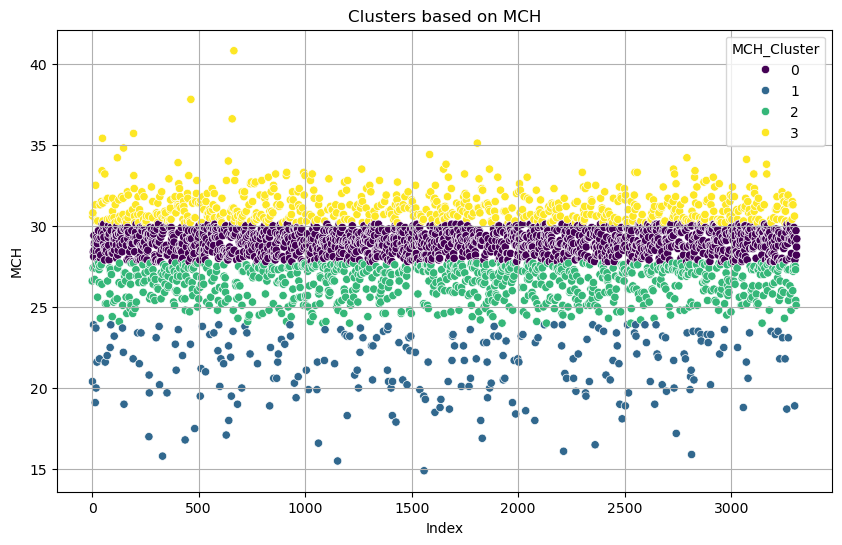

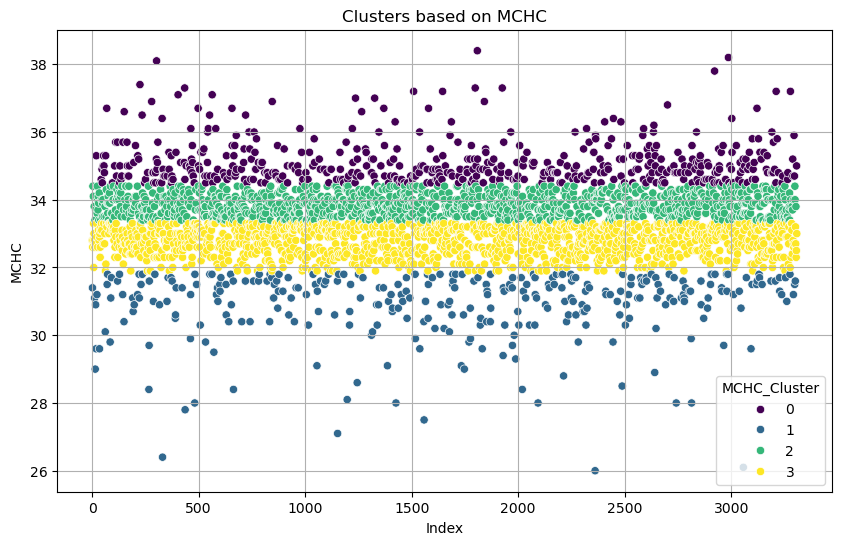

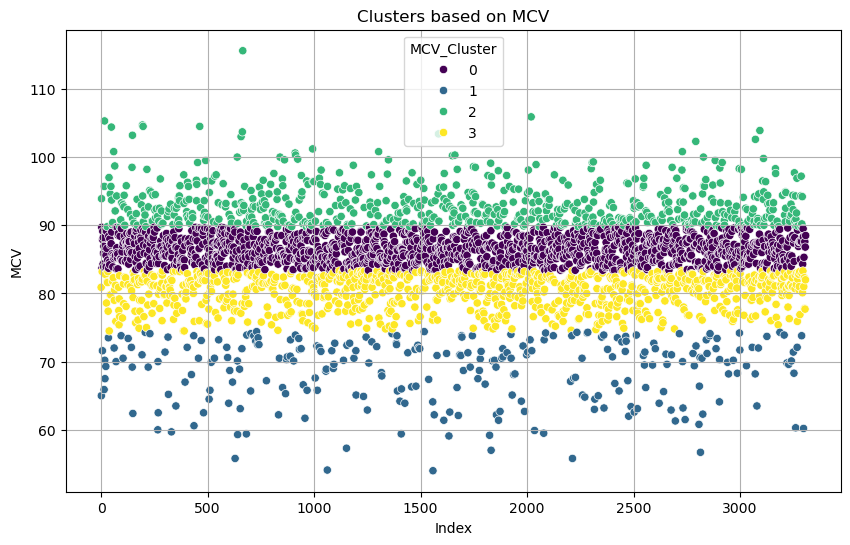

In [70]:
from sklearn.cluster import KMeans
import seaborn as sns
import matplotlib.pyplot as plt

# Function to perform K-Means clustering on a single parameter
def cluster_single_parameter(df, param, n_clusters=4):
    # Reshape data to fit the model
    data = df[[param]].values.reshape(-1, 1)
    
    # Apply K-Means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    df[f'{param}_Cluster'] = kmeans.fit_predict(data)
    
    # Plot the clusters
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=df.index, y=param, hue=f'{param}_Cluster', data=df, palette='viridis')
    plt.title(f'Clusters based on {param}')
    plt.xlabel('Index')
    plt.ylabel(param)
    plt.grid(True)
    plt.savefig(f"{visuals_path}/clusters_{param}.png")
    plt.show()
    
    # Save the cluster assignments
    df[[f'{param}_Cluster']].to_csv(f"{processed_data_path}/{param}_cluster_assignments.csv", index=False)
    
    return df

# Apply the function to each parameter
for param in parameters:
    df = cluster_single_parameter(df, param)


In [74]:
import pandas as pd

#  'SEX' column is already mapped to 0 for females and 1 for males

# Split the data by gender
df_males = df[df['SEX'] == 1]
df_females = df[df['SEX'] == 0]

# Define your columns of interest
parameters = [
    'HAEMATOCRIT', 'HAEMOGLOBINS', 'ERYTHROCYTE', 
    'LEUCOCYTE', 'THROMBOCYTE', 'MCH', 
    'MCHC', 'MCV'
]

# Function to estimate thresholds based on percentiles
def estimate_thresholds(df):
    thresholds = {}
    for param in parameters:
        lower = df[param].quantile(0.05)
        upper = df[param].quantile(0.95)
        thresholds[param] = (lower, upper)
    return thresholds

# Estimate thresholds for males and females
male_thresholds = estimate_thresholds(df_males)
female_thresholds = estimate_thresholds(df_females)

# Real-world thresholds (can be adjusted based on gender-specific ranges)
real_world_thresholds_male = {
    'HAEMATOCRIT': (38.3, 48.6),
    'HAEMOGLOBINS': (13.8, 17.2),
    'ERYTHROCYTE': (4.7, 6.1),
    'LEUCOCYTE': (4.0, 11.0),
    'THROMBOCYTE': (150, 450),
    'MCH': (27, 31),
    'MCHC': (32, 36),
    'MCV': (80, 100)
}

real_world_thresholds_female = {
    'HAEMATOCRIT': (35.5, 44.9),
    'HAEMOGLOBINS': (12.1, 15.1),
    'ERYTHROCYTE': (4.2, 5.4),
    'LEUCOCYTE': (4.0, 11.0),
    'THROMBOCYTE': (150, 450),
    'MCH': (27, 31),
    'MCHC': (32, 36),
    'MCV': (80, 100)
}

# Create a comparison table for males
comparison_df_males = pd.DataFrame({
    'Parameter': parameters,
    'Male Lower Percentile Threshold': [male_thresholds[param][0] for param in parameters],
    'Male Upper Percentile Threshold': [male_thresholds[param][1] for param in parameters],
    'Real World Lower Threshold (Male)': [real_world_thresholds_male[param][0] for param in parameters],
    'Real World Upper Threshold (Male)': [real_world_thresholds_male[param][1] for param in parameters],
})

# Create a comparison table for females
comparison_df_females = pd.DataFrame({
    'Parameter': parameters,
    'Female Lower Percentile Threshold': [female_thresholds[param][0] for param in parameters],
    'Female Upper Percentile Threshold': [female_thresholds[param][1] for param in parameters],
    'Real World Lower Threshold (Female)': [real_world_thresholds_female[param][0] for param in parameters],
    'Real World Upper Threshold (Female)': [real_world_thresholds_female[param][1] for param in parameters],
})

# Save the comparison tables
comparison_df_males.to_csv(f"{processed_data_path}/threshold_comparison_males.csv", index=False)
comparison_df_females.to_csv(f"{processed_data_path}/threshold_comparison_females.csv", index=False)

# Display 
display(comparison_df_males)
display(comparison_df_females)


,Parameter,Male Lower Percentile Threshold,Male Upper Percentile Threshold,Real World Lower Threshold (Male),Real World Upper Threshold (Male)
0,HAEMATOCRIT,27.80,48.19,38.3,48.6
1,HAEMOGLOBINS,9.20,16.39,13.8,17.2
2,ERYTHROCYTE,3.25,5.91,4.7,6.1
3,LEUCOCYTE,3.41,18.40,4.0,11.0
4,THROMBOCYTE,67.00,431.90,150.0,450.0
5,MCH,23.51,31.80,27.0,31.0
6,MCHC,31.60,35.40,32.0,36.0
7,MCV,71.50,94.49,80.0,100.0


,Parameter,Female Lower Percentile Threshold,Female Upper Percentile Threshold,Real World Lower Threshold (Female),Real World Upper Threshold (Female)
0,HAEMATOCRIT,27.825,43.4000,35.5,44.9
1,HAEMOGLOBINS,9.000,14.4000,12.1,15.1
2,ERYTHROCYTE,3.230,5.3875,4.2,5.4
3,LEUCOCYTE,3.000,16.6750,4.0,11.0
4,THROMBOCYTE,82.250,437.0000,150.0,450.0
5,MCH,22.125,31.5000,27.0,31.0
6,MCHC,30.900,34.8000,32.0,36.0
7,MCV,70.525,94.5000,80.0,100.0


In [78]:
# Real-world thresholds for Males
real_world_thresholds_male = {
    'Infants and Young Children': {
        'HAEMATOCRIT': (30.0, 40.0),
        'HAEMOGLOBINS': (10.5, 14.0),
        'ERYTHROCYTE': (4.1, 5.5),
        'LEUCOCYTE': (6.0, 15.5),
        'THROMBOCYTE': (150, 400),
        'MCH': (25.0, 30.0),
        'MCHC': (31.0, 35.0),
        'MCV': (75.0, 85.0)
    },
    'Adolescents and Young Adults': {
        'HAEMATOCRIT': (37.0, 47.0),
        'HAEMOGLOBINS': (13.0, 17.0),
        'ERYTHROCYTE': (4.5, 5.9),
        'LEUCOCYTE': (4.5, 13.0),
        'THROMBOCYTE': (150, 400),
        'MCH': (26.0, 32.0),
        'MCHC': (32.0, 36.0),
        'MCV': (80.0, 95.0)
    },
    'Middle-aged Adults': {
        'HAEMATOCRIT': (38.0, 48.0),
        'HAEMOGLOBINS': (13.5, 17.5),
        'ERYTHROCYTE': (4.6, 6.0),
        'LEUCOCYTE': (4.0, 11.0),
        'THROMBOCYTE': (150, 450),
        'MCH': (27.0, 31.0),
        'MCHC': (32.0, 36.0),
        'MCV': (80.0, 100.0)
    },
    'Older Adults': {
        'HAEMATOCRIT': (37.0, 47.0),
        'HAEMOGLOBINS': (13.0, 17.0),
        'ERYTHROCYTE': (4.5, 6.0),
        'LEUCOCYTE': (4.0, 11.0),
        'THROMBOCYTE': (150, 450),
        'MCH': (27.0, 32.0),
        'MCHC': (32.0, 36.0),
        'MCV': (80.0, 100.0)
    },
    'Elderly': {
        'HAEMATOCRIT': (36.0, 46.0),
        'HAEMOGLOBINS': (12.5, 16.5),
        'ERYTHROCYTE': (4.4, 5.8),
        'LEUCOCYTE': (4.0, 11.0),
        'THROMBOCYTE': (150, 450),
        'MCH': (27.0, 32.0),
        'MCHC': (32.0, 36.0),
        'MCV': (80.0, 100.0)
    }
}

# Real-world thresholds for Females 
real_world_thresholds_female = {
    'Infants and Young Children': {
        'HAEMATOCRIT': (30.0, 40.0),
        'HAEMOGLOBINS': (10.5, 14.0),
        'ERYTHROCYTE': (4.1, 5.5),
        'LEUCOCYTE': (6.0, 15.5),
        'THROMBOCYTE': (150, 400),
        'MCH': (25.0, 30.0),
        'MCHC': (31.0, 35.0),
        'MCV': (75.0, 85.0)
    },
    'Adolescents and Young Adults': {
        'HAEMATOCRIT': (36.0, 45.0),
        'HAEMOGLOBINS': (12.0, 15.5),
        'ERYTHROCYTE': (4.2, 5.4),
        'LEUCOCYTE': (4.5, 13.0),
        'THROMBOCYTE': (150, 400),
        'MCH': (26.0, 32.0),
        'MCHC': (32.0, 36.0),
        'MCV': (80.0, 95.0)
    },
    'Middle-aged Adults': {
        'HAEMATOCRIT': (37.0, 47.0),
        'HAEMOGLOBINS': (12.0, 16.0),
        'ERYTHROCYTE': (4.3, 5.5),
        'LEUCOCYTE': (4.0, 11.0),
        'THROMBOCYTE': (150, 450),
        'MCH': (27.0, 31.0),
        'MCHC': (32.0, 36.0),
        'MCV': (80.0, 100.0)
    },
    'Older Adults': {
        'HAEMATOCRIT': (36.0, 46.0),
        'HAEMOGLOBINS': (11.5, 15.5),
        'ERYTHROCYTE': (4.2, 5.4),
        'LEUCOCYTE': (4.0, 11.0),
        'THROMBOCYTE': (150, 450),
        'MCH': (27.0, 32.0),
        'MCHC': (32.0, 36.0),
        'MCV': (80.0, 100.0)
    },
    'Elderly': {
        'HAEMATOCRIT': (35.0, 44.0),
        'HAEMOGLOBINS': (11.0, 15.0),
        'ERYTHROCYTE': (4.1, 5.3),
        'LEUCOCYTE': (4.0, 11.0),
        'THROMBOCYTE': (150, 450),
        'MCH': (27.0, 32.0),
        'MCHC': (32.0, 36.0),
        'MCV': (80.0, 100.0)
    }
}


In [80]:
import pandas as pd

# Define age groups
age_bins = [0, 12, 35, 55, 75, 100]
age_labels = ['Infants and Young Children', 'Adolescents and Young Adults', 'Middle-aged Adults', 'Older Adults', 'Elderly']

df['AGE_GROUP'] = pd.cut(df['AGE'], bins=age_bins, labels=age_labels, right=False)

# Split the data by gender
df_males = df[df['SEX'] == 1]
df_females = df[df['SEX'] == 0]

# List of parameters to calculate thresholds for
parameters = ['HAEMATOCRIT', 'HAEMOGLOBINS', 'ERYTHROCYTE', 'LEUCOCYTE', 'THROMBOCYTE', 'MCH', 'MCHC', 'MCV']

# Function to calculate thresholds for each age group
def calculate_thresholds(df, parameters):
    threshold_data = {}
    for age_group in df['AGE_GROUP'].unique():
        group_df = df[df['AGE_GROUP'] == age_group]
        thresholds = {param: (group_df[param].quantile(0.05), group_df[param].quantile(0.95)) for param in parameters}
        threshold_data[age_group] = thresholds
    return threshold_data

# Calculate thresholds for males
male_thresholds = calculate_thresholds(df_males, parameters)

# Calculate thresholds for females
female_thresholds = calculate_thresholds(df_females, parameters)

# Function to convert thresholds to a DataFrame and compare with real-world thresholds
def thresholds_to_dataframe(thresholds, real_world_thresholds, gender):
    data = []
    for age_group, params in thresholds.items():
        for param, (lower, upper) in params.items():
            real_lower, real_upper = real_world_thresholds[age_group][param]
            data.append([age_group, param, lower, upper, real_lower, real_upper])
    df_thresholds = pd.DataFrame(data, columns=[
        'Age Group', 'Parameter', 
        f'{gender} Lower Percentile Threshold', f'{gender} Upper Percentile Threshold',
        f'Real World Lower Threshold ({gender})', f'Real World Upper Threshold ({gender})'
    ])
    return df_thresholds

# Convert to DataFrames and compare with real-world thresholds
male_thresholds_df = thresholds_to_dataframe(male_thresholds, real_world_thresholds_male, 'Male')
female_thresholds_df = thresholds_to_dataframe(female_thresholds, real_world_thresholds_female, 'Female')

# Save to CSV files
male_thresholds_df.to_csv("C:/Users/akp24/docassist-main/data/processed/male_thresholds_by_age_comparison.csv", index=False)
female_thresholds_df.to_csv("C:/Users/akp24/docassist-main/data/processed/female_thresholds_by_age_comparison.csv", index=False)

display(male_thresholds_df)
display(female_thresholds_df)


,Age Group,Parameter,Male Lower Percentile Threshold,Male Upper Percentile Threshold,Real World Lower Threshold (Male),Real World Upper Threshold (Male)
0,Middle-aged Adults,HAEMATOCRIT,29.8000,48.675,38.0,48.0
1,Middle-aged Adults,HAEMOGLOBINS,9.6000,16.400,13.5,17.5
2,Middle-aged Adults,ERYTHROCYTE,3.5275,6.015,4.6,6.0
3,Middle-aged Adults,LEUCOCYTE,3.9250,18.550,4.0,11.0
4,Middle-aged Adults,THROMBOCYTE,79.0000,479.750,150.0,450.0
5,Middle-aged Adults,MCH,22.5000,31.300,27.0,31.0
6,Middle-aged Adults,MCHC,31.4000,35.200,32.0,36.0
7,Middle-aged Adults,MCV,70.9250,92.175,80.0,100.0
8,Older Adults,HAEMATOCRIT,26.7900,46.100,37.0,47.0
9,Older Adults,HAEMOGLOBINS,8.9000,15.700,13.0,17.0


,Age Group,Parameter,Female Lower Percentile Threshold,Female Upper Percentile Threshold,Real World Lower Threshold (Female),Real World Upper Threshold (Female)
0,Adolescents and Young Adults,HAEMATOCRIT,30.030,43.3000,36.0,45.0
1,Adolescents and Young Adults,HAEMOGLOBINS,9.700,14.4000,12.0,15.5
2,Adolescents and Young Adults,ERYTHROCYTE,3.591,5.4880,4.2,5.4
3,Adolescents and Young Adults,LEUCOCYTE,3.000,13.7900,4.5,13.0
4,Adolescents and Young Adults,THROMBOCYTE,115.200,432.9000,150.0,400.0
5,Adolescents and Young Adults,MCH,21.500,31.0000,26.0,32.0
6,Adolescents and Young Adults,MCHC,30.710,34.6000,32.0,36.0
7,Adolescents and Young Adults,MCV,69.240,91.0900,80.0,95.0
8,Older Adults,HAEMATOCRIT,25.710,43.6600,36.0,46.0
9,Older Adults,HAEMOGLOBINS,8.570,14.6000,11.5,15.5


In [82]:
import numpy as np
# Remove outliers based on Z-score
df_no_outliers_zscore = df[(df['HAEMATOCRIT_outlier_zscore'] == 0) &
                           (df['HAEMOGLOBINS_outlier_zscore'] == 0) &
                           (df['ERYTHROCYTE_outlier_zscore'] == 0) &
                           (df['LEUCOCYTE_outlier_zscore'] == 0) &
                           (df['THROMBOCYTE_outlier_zscore'] == 0) &
                           (df['MCH_outlier_zscore'] == 0) &
                           (df['MCHC_outlier_zscore'] == 0) &
                           (df['MCV_outlier_zscore'] == 0)]

# Alternatively, remove outliers based on IQR
df_no_outliers_iqr = df[(df['HAEMATOCRIT_outlier_iqr'] == 0) &
                        (df['HAEMOGLOBINS_outlier_iqr'] == 0) &
                        (df['ERYTHROCYTE_outlier_iqr'] == 0) &
                        (df['LEUCOCYTE_outlier_iqr'] == 0) &
                        (df['THROMBOCYTE_outlier_iqr'] == 0) &
                        (df['MCH_outlier_iqr'] == 0) &
                        (df['MCHC_outlier_iqr'] == 0) &
                        (df['MCV_outlier_iqr'] == 0)]


In [84]:
# Re-calculate thresholds after removing outliers
def calculate_thresholds(cleaned_df):
    thresholds = {}
    for param in parameters:
        lower_threshold = np.percentile(cleaned_df[param], 2.5)
        upper_threshold = np.percentile(cleaned_df[param], 97.5)
        thresholds[param] = (lower_threshold, upper_threshold)
    return thresholds

# Apply to both Z-score and IQR cleaned data
thresholds_zscore_cleaned = calculate_thresholds(df_no_outliers_zscore)
thresholds_iqr_cleaned = calculate_thresholds(df_no_outliers_iqr)


In [86]:
import pandas as pd

# Define age groups
age_bins = [0, 12, 35, 55, 75, 100]
age_labels = ['Infants and Young Children', 'Adolescents and Young Adults', 'Middle-aged Adults', 'Older Adults', 'Elderly']

df['AGE_GROUP'] = pd.cut(df['AGE'], bins=age_bins, labels=age_labels, right=False)

# Split the data by gender
df_males = df[df['SEX'] == 1]
df_females = df[df['SEX'] == 0]

# List of parameters to calculate thresholds for
parameters = ['HAEMATOCRIT', 'HAEMOGLOBINS', 'ERYTHROCYTE', 'LEUCOCYTE', 'THROMBOCYTE', 'MCH', 'MCHC', 'MCV']

# Function to calculate thresholds for each age group
def calculate_thresholds(df, parameters):
    threshold_data = {}
    for age_group in df['AGE_GROUP'].unique():
        group_df = df[df['AGE_GROUP'] == age_group]
        thresholds = {param: (group_df[param].quantile(0.05), group_df[param].quantile(0.95)) for param in parameters}
        threshold_data[age_group] = thresholds
    return threshold_data

# Calculate thresholds for males
male_thresholds = calculate_thresholds(df_males, parameters)

# Calculate thresholds for females
female_thresholds = calculate_thresholds(df_females, parameters)

# Function to convert thresholds to a DataFrame and compare with real-world thresholds
def thresholds_to_dataframe(thresholds, real_world_thresholds, gender):
    data = []
    for age_group, params in thresholds.items():
        for param, (lower, upper) in params.items():
            real_lower, real_upper = real_world_thresholds[age_group][param]
            data.append([age_group, param, lower, upper, real_lower, real_upper])
    df_thresholds = pd.DataFrame(data, columns=[
        'Age Group', 'Parameter', 
        f'{gender} Lower Percentile Threshold', f'{gender} Upper Percentile Threshold',
        f'Real World Lower Threshold ({gender})', f'Real World Upper Threshold ({gender})'
    ])
    return df_thresholds

# Convert to DataFrames and compare with real-world thresholds
male_thresholds_df = thresholds_to_dataframe(male_thresholds, real_world_thresholds_male, 'Male')
female_thresholds_df = thresholds_to_dataframe(female_thresholds, real_world_thresholds_female, 'Female')

# Save to CSV files
male_thresholds_df.to_csv("C:/Users/akp24/docassist-main/data/processed/male_thresholds_by_age_comparison.csv", index=False)
female_thresholds_df.to_csv("C:/Users/akp24/docassist-main/data/processed/female_thresholds_by_age_comparison.csv", index=False)

# Display
display(male_thresholds_df)
display(female_thresholds_df)


,Age Group,Parameter,Male Lower Percentile Threshold,Male Upper Percentile Threshold,Real World Lower Threshold (Male),Real World Upper Threshold (Male)
0,Middle-aged Adults,HAEMATOCRIT,29.8000,48.675,38.0,48.0
1,Middle-aged Adults,HAEMOGLOBINS,9.6000,16.400,13.5,17.5
2,Middle-aged Adults,ERYTHROCYTE,3.5275,6.015,4.6,6.0
3,Middle-aged Adults,LEUCOCYTE,3.9250,18.550,4.0,11.0
4,Middle-aged Adults,THROMBOCYTE,79.0000,479.750,150.0,450.0
5,Middle-aged Adults,MCH,22.5000,31.300,27.0,31.0
6,Middle-aged Adults,MCHC,31.4000,35.200,32.0,36.0
7,Middle-aged Adults,MCV,70.9250,92.175,80.0,100.0
8,Older Adults,HAEMATOCRIT,26.7900,46.100,37.0,47.0
9,Older Adults,HAEMOGLOBINS,8.9000,15.700,13.0,17.0


,Age Group,Parameter,Female Lower Percentile Threshold,Female Upper Percentile Threshold,Real World Lower Threshold (Female),Real World Upper Threshold (Female)
0,Adolescents and Young Adults,HAEMATOCRIT,30.030,43.3000,36.0,45.0
1,Adolescents and Young Adults,HAEMOGLOBINS,9.700,14.4000,12.0,15.5
2,Adolescents and Young Adults,ERYTHROCYTE,3.591,5.4880,4.2,5.4
3,Adolescents and Young Adults,LEUCOCYTE,3.000,13.7900,4.5,13.0
4,Adolescents and Young Adults,THROMBOCYTE,115.200,432.9000,150.0,400.0
5,Adolescents and Young Adults,MCH,21.500,31.0000,26.0,32.0
6,Adolescents and Young Adults,MCHC,30.710,34.6000,32.0,36.0
7,Adolescents and Young Adults,MCV,69.240,91.0900,80.0,95.0
8,Older Adults,HAEMATOCRIT,25.710,43.6600,36.0,46.0
9,Older Adults,HAEMOGLOBINS,8.570,14.6000,11.5,15.5
